**OYEKANMI OLATUNDE HOMEWORK1**

**Question 1**

**Implementation of TSP**

In [1]:
#import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#define a function that returns the euclidean distance between two points in the 2D plane
def compute_distance(p1, p2):
    """
    P1 : First point in (x,y) format
    p2: second point in (x,y) format
    
    Returns the Euclidean distance of two points in the 2D Plane.
    """
    return ((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)**0.5   

In [3]:
def compute_distance_dict(salesman_pos, uncovered_positions, dataset):
    """
    salesman_pos : salesman position (int)
    uncovered_positions : Other positions or points that are yet to ve visited or covered (int)
    dataset : This has the 2D x and y information of all the points to be covered . e.g point 1 : [x,y]
    
    Returns the distance between salesman current positions and other points / cities yet to be visited
    """
    
    distance_dict = {}
    for j in uncovered_positions:
         distance_dict[salesman_pos,j] = compute_distance(dataset[salesman_pos], dataset[j])
    return distance_dict

In [4]:
def get_nearest_neighbor(salesman_pos , distance_dict):
    
    """
    salesman_pos : salesman current position (int)
    distance_dict: dictionary with positions as keys and distance as values e.e {(0, 0): 0.0, (0, 1): 0.8891393032838779}
    
    This function check the distance dictionary and returns the nearest neighbor and its corresponding distance
    """
    for x in list(distance_dict.keys()):
        if  x[0]==salesman_pos and x[1]!=x[0]:
            if distance_dict[x]== min(distance_dict.values()):
                next_move= x[1]
                nearest_neighbor_distance=distance_dict[x] 
                return next_move,nearest_neighbor_distance
            else:
                continue

In [5]:
def TSP(n, dataset):
    """
    n : The number of points or cities the salesman need to visit in total
    
    Returns : The total distance covered by the salesman over n points.
    
    dataset : The dataset has two columns, one for each x and y with an index n
    """
    list_of_points = [x for x in np.arange(n)]

    #randomly selects start position for the salesman. Data format [x,y]
    salesman_pos = np.random.choice(list_of_points, replace=False)   #
    print(f"Salesman start position: {salesman_pos}")
    print('\n')

    covered_position = []
    covered_distance=0

    print(f"distance convered at start point : {covered_distance}")

    for i in range(n):

        covered_position.append(salesman_pos)
        print(f"covered points: {covered_position}")

        uncovered_positions = list(set(list_of_points)-set(covered_position))
        print(f" uncovered points: {uncovered_positions}")

        if len(uncovered_positions)!=0:

            print("\n")
            salesman_xy_info = dataset[salesman_pos]
            print(f" salesman position info x and y:{salesman_xy_info}")

            #get the dictionary with current position and all its neighbor distances
            neighbor_distance_dict = compute_distance_dict(salesman_pos, uncovered_positions, dataset)
            print(neighbor_distance_dict)
            print("\n")


            #get the nearest neighbor and corrresponding distance from the distance dictionary above
            next_salesman_step, nearest_neighbor_distance = get_nearest_neighbor(salesman_pos , neighbor_distance_dict)
            print(f"nearest neighbor:{next_salesman_step}")

            print(f"distance to nearest neighbor:{nearest_neighbor_distance}")

            print("\n")
            print("Update or Move to the next point")
            salesman_pos = next_salesman_step
            covered_distance+= nearest_neighbor_distance
            print(f"Cummulative distance till date {covered_distance}")

        else:
            print("\n")
            final_distance_to_start_point = compute_distance(dataset[covered_position[0]], dataset[covered_position[-1]])
            total_distance = covered_distance + final_distance_to_start_point
            print(f"Total TSP distance {total_distance}")
            
    return total_distance, covered_position

In [6]:
def TSP_replications(no_of_runs, n, dataset):
    """
    no_of_runs : The number of time I will run the TSP before I choose the shortest path, no_of_run >= 2*n
    n : number of data points that the salesman need to cover
    dataset: The dataset has two columns, one for each x and y : n is the row index of the dataset
    
    """
    distance_list=[]
    route_list = []
    
    for i in range(no_of_runs):
        
        get_total_distance, get_route= TSP(n, dataset)
        distance_list.append(get_total_distance)
        route_list.append(get_route)
        
    return distance_list , route_list

In [7]:
def get_best_route(no_of_runs, n, dataset):
    """
    This function produce the best route after no_of_runs replications, for n points and dataset with x,y points
    """  
    # unpack the list of distances for no_of_runs of n data points 
    distance_list , route_list = TSP_replications(no_of_runs,n, dataset)
            
    #get the total distance and route with the minimum distance among the replications
    for idx , values in enumerate(distance_list):
        if values ==min(distance_list):
            print(f"Best TSP Route: {route_list[idx]}")
            print(f"Best Total distance travelled: {distance_list[idx]}")
            print(f"run with minimum distance :{idx}")
            best_route_index = route_list[idx]
            best_route_index.append(best_route_index[0])  # the traveling salesman returns to initial starting point
    
            return best_route_index , distance_list[idx]
            

In [8]:
def compute_final_distance(dataset, best_route):
    """
    salesman_pos : salesman position (int)
    uncovered_positions : Other positions or points that are yet to ve visited or covered (int)
    dataset : This has the 2D x and y information of all the points to be covered . e.g point 1 : [x,y]   
    Returns the distance between salesman current positions and other points / cities yet to be visited
    """
    total_distance=0

    for index, values in enumerate(best_route):
        if index < len(best_route)-1:
            total_distance= total_distance + compute_distance(dataset.iloc[best_route[index]], dataset.iloc[best_route[index+1]])
        else:
            break
    print(f"The total distance is : {total_distance}")

**Load datapoints with their X and y coordinates**

In [9]:
#import dataset and clean
dataset= pd.read_csv("https://people.sc.fsu.edu/~jburkardt/datasets/cities/uscap_xy.txt", sep="\t", names=['x'])
new_dataset=dataset.x.str.split(" ", expand=True)
new_dataset.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,,,,,-5961.513053174005,,,,,,,,,2236.041995790761,,,,
1,,,,,-9287.821354574531,,,,,,,,,4028.410982687635,,,,
2,,,,,-7743.816805421991,,,,,,,,,2311.143387140668,,,,
3,,,,,-6379.680295493998,,,,,,,,,2400.107649091518,,,,
4,,,,,-8392.976246048636,,,,,,,,,2664.025175599511,,,,


In [10]:
#filter useful columns from the above dataframe
data= new_dataset.iloc[:,[4,13]]
data.head()

,4,13
0,-5961.513053174005,2236.041995790761
1,-9287.821354574531,4028.410982687635
2,-7743.816805421991,2311.143387140668
3,-6379.680295493998,2400.107649091518
4,-8392.976246048636,2664.025175599511


In [11]:
#rename the columns as X and Y coordinates 
data_final=data.rename(columns={4:'X', 13:'Y'})
data_final.head()

,X,Y
0,-5961.513053174005,2236.041995790761
1,-9287.821354574531,4028.410982687635
2,-7743.816805421991,2311.143387140668
3,-6379.680295493998,2400.107649091518
4,-8392.976246048636,2664.025175599511


The dataset is first normalized to improve visualization and computation speed

In [12]:
#normalize the dataset
from sklearn.preprocessing import MinMaxScaler
normalized_data = MinMaxScaler().fit_transform(data_final)

In [13]:
normalized_data[:5]

array([[0.81247236, 0.29877524],
       [0.26579829, 1.        ],
       [0.51955325, 0.328157  ],
       [0.74374716, 0.3629623 ],
       [0.41286482, 0.4662142 ]])

In [14]:
normalized_data

array([[0.81247236, 0.29877524],
       [0.26579829, 1.        ],
       [0.51955325, 0.328157  ],
       [0.74374716, 0.3629623 ],
       [0.41286482, 0.4662142 ],
       [0.60006203, 0.49820842],
       [0.96693495, 0.55302512],
       [0.93457377, 0.48260423],
       [0.83525599, 0.24715091],
       [0.83392476, 0.33657868],
       [0.        , 0.        ],
       [0.47227   , 0.60294645],
       [0.77418914, 0.49940009],
       [0.81396488, 0.49960802],
       [0.72910112, 0.54826581],
       [0.7056045 , 0.47930844],
       [0.82855222, 0.45652774],
       [0.75727067, 0.24732094],
       [1.        , 0.62213376],
       [0.92350868, 0.4774958 ],
       [0.9856663 , 0.56568157],
       [0.83214531, 0.5791517 ],
       [0.73508409, 0.63906846],
       [0.76786821, 0.29765238],
       [0.74535785, 0.46668318],
       [0.52008485, 0.68355811],
       [0.69441514, 0.52715178],
       [0.43234053, 0.48257795],
       [0.97974282, 0.59230535],
       [0.94332472, 0.51125344],
       [0.

**Visualize the points in a 2D plane**

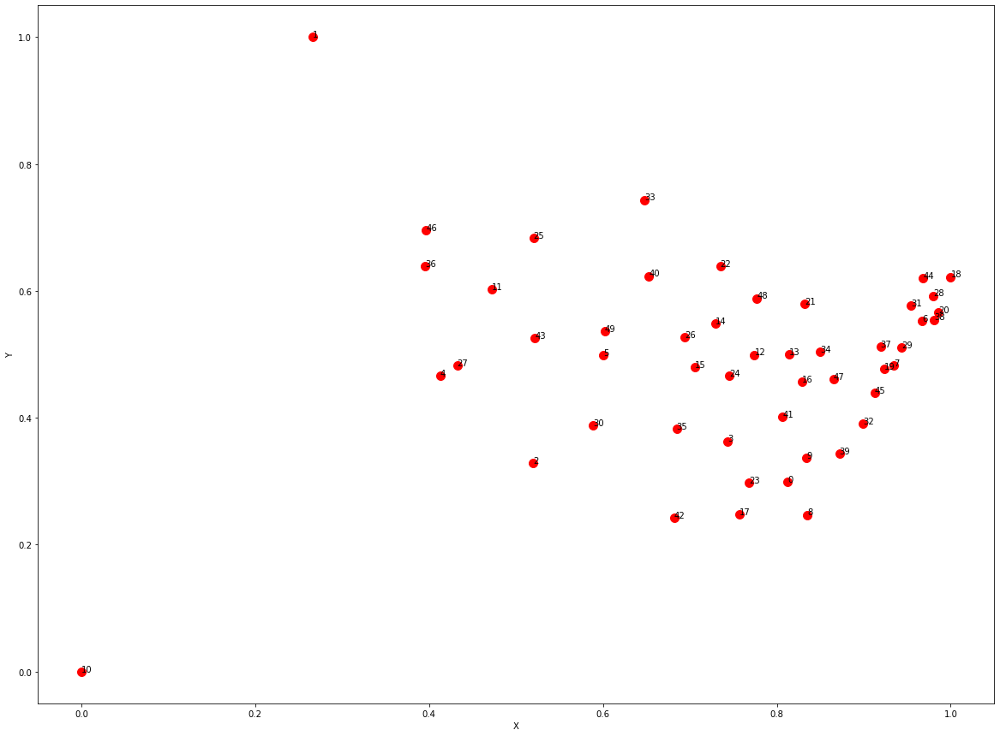

In [15]:
#sns.set_theme(style="darkgrid")
plt.figure(figsize=(20,15))
plt.scatter(x=normalized_data[:,0] , y=normalized_data[:,1],s=100,color="red")
plt.xlabel("X")
plt.ylabel("Y")
for i in range(len(normalized_data)):
    plt.annotate(i, (normalized_data[i][0], normalized_data[i][1]))

plt.show()
# sns.scatterplot(x=normalized_data[:,0] , y=normalized_data[:,1], data=normalized_data)

**Apply my TSP algorithm**

In [16]:
#run 150 iterations
# 50 data points
get_best_tsp, get_best_distance= get_best_route(150, 50, normalized_data)

(get_best_tsp, get_best_distance)

Salesman start position: 27


distance convered at start point : 0
covered points: [27]
 uncovered points: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


 salesman position info x and y:[0.43234053 0.48257795]
{(27, 0): 0.4222364799419584, (27, 1): 0.5435640639542063, (27, 2): 0.17734680817229562, (27, 3): 0.33358956189219774, (27, 4): 0.025437681670638937, (27, 5): 0.1684482532633012, (27, 6): 0.539216095295215, (27, 7): 0.5022332444209384, (27, 8): 0.4666548662875941, (27, 9): 0.42730045725362265, (27, 10): 0.6479196035648146, (27, 11): 0.12681852272549707, (27, 12): 0.34226226895509837, (27, 13): 0.38200414914261105, (27, 14): 0.30394365188642747, (27, 15): 0.27328353003322886, (27, 16): 0.39706715137660803, (27, 17): 0.40115515777308797, (27, 18): 0.5845623161049588, (27, 19): 0.49119444591822, (27, 20): 0.5595316081880193, (27, 21): 0.411303



Update or Move to the next point
Cummulative distance till date 0.8052046208565136
covered points: [9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26]
 uncovered points: [0, 1, 2, 3, 4, 5, 8, 10, 11, 12, 13, 15, 16, 17, 22, 23, 24, 25, 27, 30, 33, 34, 35, 36, 40, 41, 42, 43, 46, 47, 49]


 salesman position info x and y:[0.69441514 0.52715178]
{(26, 0): 0.2570862711565552, (26, 1): 0.6381989068226795, (26, 2): 0.2649067829822351, (26, 3): 0.17144046683678899, (26, 4): 0.28806939213466876, (26, 5): 0.09869259336064716, (26, 8): 0.31342723650609966, (26, 10): 0.8718379392643737, (26, 11): 0.2347196130541177, (26, 12): 0.08446329235692836, (26, 13): 0.12268169638434764, (26, 15): 0.049134376738815856, (26, 16): 0.1515932440804429, (26, 17): 0.2868032703014454, (26, 22): 0.11907689191340279, (26, 23): 0.24096748705556606, (26, 24): 0.07906713155076264, (26, 25): 0.2342092874401455, (26, 27): 0.26583816558529344, (26, 30): 0.17450782718560154, (26, 33): 0.22131290778

 salesman position info x and y:[0.74374716 0.3629623 ]
{(3, 1): 0.796399494111915, (3, 2): 0.2268795215449856, (3, 33): 0.39244639225906436, (3, 4): 0.34661806188951333, (3, 5): 0.1973244283615176, (3, 35): 0.06244273267488225, (3, 36): 0.4443814084733214, (3, 8): 0.14760130166299165, (3, 40): 0.27578566502427937, (3, 10): 0.8275877430740919, (3, 11): 0.36234271272053986, (3, 43): 0.2753454077675692, (3, 46): 0.4807446626239147, (3, 49): 0.22377589310386486, (3, 22): 0.27624203130622127, (3, 25): 0.3909047229335421, (3, 27): 0.33358956189219774, (3, 30): 0.15685158921320017}


nearest neighbor:35
distance to nearest neighbor:0.06244273267488225


Update or Move to the next point
Cummulative distance till date 1.6166936798514204
covered points: [32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 9, 39, 0, 23, 17, 42, 3, 35]
 uncovered points: [1, 2, 33, 4, 5, 36, 8, 40, 10, 11, 43, 46, 49, 22, 25, 27, 30]


 salesman position info x and y:

 salesman position info x and y:[0.81247236 0.29877524]
{(0, 1): 0.8891393032838779, (0, 2): 0.29438900928418676, (0, 3): 0.09403792496132592, (0, 4): 0.43326896015468186, (0, 5): 0.2913618727037597, (0, 6): 0.29749234184422474, (0, 8): 0.056428409073676015, (0, 10): 0.8656662027381286, (0, 11): 0.45635268099545184, (0, 12): 0.20424478969048512, (0, 13): 0.2008383254091773, (0, 14): 0.26305191313361015, (0, 15): 0.2097926971278134, (0, 16): 0.15856990432435866, (0, 17): 0.07546370203773255, (0, 18): 0.37380121941114075, (0, 20): 0.31817468842748003, (0, 21): 0.281065795723479, (0, 22): 0.34898197609873277, (0, 23): 0.04461827516762486, (0, 24): 0.18082431740350371, (0, 25): 0.48326836390358907, (0, 26): 0.2570862711565552, (0, 27): 0.4222364799419584, (0, 28): 0.3378451329481977, (0, 30): 0.2407425152714242, (0, 31): 0.3124740557972122, (0, 33): 0.47423074250067176, (0, 34): 0.2088091912150478, (0, 35): 0.15314878796089249, (0, 36): 0.5381565790034294, (0, 38): 0.30640920932334237, (0,

 salesman position info x and y:[0.96812798 0.62058901]
{(44, 1): 0.7982604223771409, (44, 8): 0.39637227473344083, (44, 41): 0.2720413974888564, (44, 10): 1.1499576151496165, (44, 42): 0.47430687500862456, (44, 47): 0.1901866906361895, (44, 16): 0.21540077131838906, (44, 17): 0.4287071906830283, (44, 18): 0.03190942812933038}


nearest neighbor:18
distance to nearest neighbor:0.03190942812933038


Update or Move to the next point
Cummulative distance till date 2.4890237706003573
covered points: [11, 36, 46, 25, 33, 40, 22, 48, 21, 34, 13, 12, 24, 15, 26, 14, 49, 5, 43, 27, 4, 2, 30, 35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18]
 uncovered points: [1, 8, 41, 10, 42, 47, 16, 17]


 salesman position info x and y:[1.         0.62213376]
{(18, 1): 0.8257330360942075, (18, 8): 0.409576277143861, (18, 41): 0.29323865930934795, (18, 10): 1.1777310475319607, (18, 42): 0.4953583411153949, (18, 47): 0.21033906323056836, (18, 16): 0.2383688180249411, (18, 17): 0.44654470

{(27, 0): 0.4222364799419584, (27, 1): 0.5435640639542063, (27, 2): 0.17734680817229562, (27, 3): 0.33358956189219774, (27, 4): 0.025437681670638937, (27, 6): 0.539216095295215, (27, 7): 0.5022332444209384, (27, 8): 0.4666548662875941, (27, 9): 0.42730045725362265, (27, 10): 0.6479196035648146, (27, 16): 0.39706715137660803, (27, 17): 0.40115515777308797, (27, 18): 0.5845623161049588, (27, 19): 0.49119444591822, (27, 20): 0.5595316081880193, (27, 23): 0.3831139461811598, (27, 28): 0.558291475252489, (27, 29): 0.5117881722991007, (27, 30): 0.18286414156848976, (27, 31): 0.5305525121494453, (27, 32): 0.47581039656540114, (27, 35): 0.2712015648802911, (27, 37): 0.4878376468372855, (27, 38): 0.5535437804427178, (27, 39): 0.4612856884997757, (27, 41): 0.3830576001641493, (27, 42): 0.34676058164783496, (27, 44): 0.553276831386772, (27, 45): 0.4822744356321876, (27, 47): 0.4334441563523089}


nearest neighbor:4
distance to nearest neighbor:0.025437681670638937


Update or Move to the next poi



nearest neighbor:38
distance to nearest neighbor:0.011996254674308045


Update or Move to the next point
Cummulative distance till date 0.011996254674308045
covered points: [20, 38]
 uncovered points: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


 salesman position info x and y:[0.98118495 0.55455379]
{(38, 0): 0.30640920932334237, (38, 1): 0.8427338830896826, (38, 2): 0.5141588522095556, (38, 3): 0.30509670506330044, (38, 4): 0.5751448963544284, (38, 5): 0.3852654636192269, (38, 6): 0.014331757961625575, (38, 7): 0.08572829663356607, (38, 8): 0.340281924012492, (38, 9): 0.2630564817258676, (38, 10): 1.127055368137462, (38, 11): 0.5112105961516292, (38, 12): 0.21421762960321103, (38, 13): 0.17601587399099608, (38, 14): 0.2521622386890001, (38, 15): 0.28566841830251805, (38, 16): 0.18139970507582046, (38, 17): 0.3801705166396656, (38, 18): 0.070150

 salesman position info x and y:[0.6822116  0.24214637]
{(42, 1): 0.864720865041443, (42, 33): 0.5025351136106444, (42, 4): 0.3503627903007315, (42, 5): 0.26891695264557103, (42, 36): 0.4894364237860212, (42, 40): 0.3823182685487245, (42, 10): 0.7239112750490269, (42, 11): 0.4174352354822559, (42, 43): 0.32584159670408464, (42, 46): 0.5358819845448207, (42, 49): 0.30478815999549236, (42, 22): 0.4004280799524484, (42, 25): 0.47024399039227355, (42, 27): 0.34676058164783496}


nearest neighbor:5
distance to nearest neighbor:0.26891695264557103


Update or Move to the next point
Cummulative distance till date 2.1446660024171367
covered points: [2, 30, 35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 8, 17, 42, 5]
 uncovered points: [1, 33, 4, 36, 40, 10, 11, 43, 46, 49, 22, 25, 27]


 salesman position info x and y:[0.60006203 0.49820842]
{(5, 1): 0.6029320331915049, (5, 33): 0.24989945356724236, (5, 4): 0.1899116287367

 salesman position info x and y:[0.98118495 0.55455379]
{(38, 0): 0.30640920932334237, (38, 1): 0.8427338830896826, (38, 2): 0.5141588522095556, (38, 3): 0.30509670506330044, (38, 4): 0.5751448963544284, (38, 5): 0.3852654636192269, (38, 8): 0.340281924012492, (38, 10): 1.127055368137462, (38, 11): 0.5112105961516292, (38, 17): 0.3801705166396656, (38, 18): 0.07015026214855379, (38, 20): 0.011996254674308045, (38, 22): 0.2602083029474086, (38, 23): 0.3339196955531293, (38, 25): 0.4788062370671162, (38, 27): 0.5535437804427178, (38, 28): 0.03777909779836672, (38, 30): 0.42609865955960596, (38, 31): 0.03505406964939355, (38, 33): 0.3831936304236314, (38, 35): 0.34251280423947905, (38, 36): 0.5920278351581375, (38, 40): 0.3354704119250052, (38, 42): 0.4324158372177653, (38, 43): 0.4604811391096861, (38, 44): 0.06731370480262, (38, 46): 0.6012771660670679, (38, 49): 0.379497576153509}


nearest neighbor:20
distance to nearest neighbor:0.011996254674308045


Update or Move to the next point

{(3, 1): 0.796399494111915, (3, 2): 0.2268795215449856, (3, 4): 0.34661806188951333, (3, 5): 0.1973244283615176, (3, 8): 0.14760130166299165, (3, 10): 0.8275877430740919, (3, 11): 0.36234271272053986, (3, 12): 0.13979264626747148, (3, 13): 0.1536313129791408, (3, 14): 0.18588140768751515, (3, 15): 0.12243891101481963, (3, 16): 0.12627901953795606, (3, 21): 0.23356387965689066, (3, 22): 0.27624203130622127, (3, 24): 0.10373338667610857, (3, 25): 0.3909047229335421, (3, 26): 0.17144046683678899, (3, 27): 0.33358956189219774, (3, 30): 0.15685158921320017, (3, 33): 0.39244639225906436, (3, 34): 0.17659399002065446, (3, 35): 0.06244273267488225, (3, 36): 0.4443814084733214, (3, 40): 0.27578566502427937, (3, 41): 0.07389284263084545, (3, 43): 0.2753454077675692, (3, 46): 0.4807446626239147, (3, 47): 0.15588251811591974, (3, 48): 0.22788346844359103, (3, 49): 0.22377589310386486}


nearest neighbor:35
distance to nearest neighbor:0.06244273267488225


Update or Move to the next point
Cummulat

{(6, 1): 0.8314921275461337, (6, 4): 0.5608296044039834, (6, 5): 0.3709455593099835, (6, 8): 0.333014081294599, (6, 11): 0.49717758495154973, (6, 12): 0.20006646125756944, (6, 13): 0.16202847922960797, (6, 14): 0.23788144333428818, (6, 15): 0.271528547654243, (6, 16): 0.1687054283949958, (6, 17): 0.37069414715137455, (6, 18): 0.07661137170819123, (6, 20): 0.02260639998944309, (6, 21): 0.13729838115411475, (6, 22): 0.24730199413755757, (6, 24): 0.2378052541735552, (6, 25): 0.46552537005195177, (6, 26): 0.2737452713971703, (6, 27): 0.539216095295215, (6, 28): 0.0413155919650669, (6, 31): 0.027198709879844487, (6, 33): 0.371644176382771, (6, 34): 0.12697910480451466, (6, 36): 0.5781497299226993, (6, 38): 0.014331757961625575, (6, 40): 0.32186688190862006, (6, 41): 0.22044278961504887, (6, 42): 0.42156017545697577, (6, 43): 0.44616374892014177, (6, 44): 0.06757442329032917, (6, 46): 0.5878034676756925, (6, 47): 0.13739927291352172, (6, 48): 0.1929912066948096, (6, 49): 0.36519134163054573}

 uncovered points: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 47, 48, 49]


 salesman position info x and y:[0.52008485 0.68355811]
{(25, 0): 0.48326836390358907, (25, 1): 0.4059521211895375, (25, 2): 0.35540150943299764, (25, 3): 0.3909047229335421, (25, 4): 0.24235203942432304, (25, 5): 0.2018684141930669, (25, 6): 0.46552537005195177, (25, 7): 0.4606338326114912, (25, 8): 0.538315978411538, (25, 9): 0.46785704340564643, (25, 10): 0.8589178922265898, (25, 12): 0.3138202812398212, (25, 13): 0.34670319833449276, (25, 14): 0.2489815379591582, (25, 15): 0.2759265616894463, (25, 16): 0.3830077133310252, (25, 17): 0.49654806511716726, (25, 18): 0.4838300327294328, (25, 19): 0.4530038218806766, (25, 20): 0.48027175821764045, (25, 21): 0.32906295271978286, (25, 22): 0.21955409773576579, (25, 23): 0.45860639881577314, (25, 24): 0.3127021908246537, (25, 26): 0.234209287440145

 uncovered points: [1, 33, 4, 5, 36, 8, 40, 10, 11, 42, 43, 46, 49, 22, 25, 27]


 salesman position info x and y:[0.51955325 0.328157  ]
{(2, 1): 0.7181675281998415, (2, 33): 0.43469909211688834, (2, 4): 0.17447697137229226, (2, 5): 0.18814661616549694, (2, 36): 0.33440324450173575, (2, 8): 0.3259297562508725, (2, 40): 0.3238759756562278, (2, 10): 0.6145100488288064, (2, 11): 0.2788278107056886, (2, 42): 0.18399882376674406, (2, 43): 0.1975141937061404, (2, 46): 0.38746861446835923, (2, 49): 0.22385627972602354, (2, 22): 0.37831135062183124, (2, 25): 0.35540150943299764, (2, 27): 0.17734680817229562}


nearest neighbor:4
distance to nearest neighbor:0.17447697137229226


Update or Move to the next point
Cummulative distance till date 1.795658417012902
covered points: [17, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 3, 35, 30, 2, 4]
 uncovered points: [1, 33, 36, 5, 8, 40, 10, 11, 42, 43, 46, 49, 22, 25, 27]


 salesma



Update or Move to the next point
Cummulative distance till date 1.6031071710816711
covered points: [37, 29, 7, 19, 45, 32, 39, 9, 0, 23, 17, 42, 3, 35, 30, 2, 4, 27, 43, 49, 5, 26, 14, 48, 21, 34]
 uncovered points: [1, 6, 8, 10, 11, 12, 13, 15, 16, 18, 20, 22, 24, 25, 28, 31, 33, 36, 38, 40, 41, 44, 46, 47]


 salesman position info x and y:[0.84970194 0.50423871]
{(34, 1): 0.765978281362965, (34, 6): 0.12697910480451466, (34, 8): 0.2574933404361735, (34, 10): 0.9880536698920873, (34, 11): 0.3901257302550654, (34, 12): 0.07566765478973655, (34, 13): 0.03603582102671856, (34, 15): 0.14623812608080822, (34, 16): 0.05218856589304455, (34, 18): 0.19102029272203785, (34, 20): 0.14920299471341114, (34, 22): 0.17696415592443546, (34, 24): 0.11089682164862168, (34, 25): 0.37523708577473214, (34, 28): 0.15705529302331128, (34, 31): 0.12758542700101963, (34, 33): 0.3130586846723084, (34, 36): 0.47398487261120337, (34, 38): 0.14078135290189067, (34, 40): 0.23008260528005262, (34, 41): 0.111276

 salesman position info x and y:[1.         0.62213376]
{(18, 1): 0.8257330360942075, (18, 2): 0.5632507556931056, (18, 3): 0.36446586130771713, (18, 4): 0.6074855004225342, (18, 5): 0.4186978269476891, (18, 10): 1.1777310475319607, (18, 11): 0.5280786947269828, (18, 12): 0.25700991795731065, (18, 13): 0.22275911592372236, (18, 14): 0.28078938397424397, (18, 15): 0.3272121390612271, (18, 16): 0.2383688180249411, (18, 17): 0.4465447067886994, (18, 21): 0.17327047259643352, (18, 22): 0.2654566315004292, (18, 23): 0.39896533161960435, (18, 24): 0.2983412578316232, (18, 25): 0.4838300327294328, (18, 26): 0.3200057529016634, (18, 27): 0.5845623161049588, (18, 30): 0.47300623014690474, (18, 33): 0.3725114906887873, (18, 34): 0.19102029272203785, (18, 35): 0.39568089363677883, (18, 36): 0.6050757842735589, (18, 40): 0.34716080201421, (18, 41): 0.29323865930934795, (18, 42): 0.4953583411153949, (18, 43): 0.4880194349405566, (18, 46): 0.6077678937914543, (18, 47): 0.21033906323056836, (18, 48):

Cummulative distance till date 0.3240564109206322
covered points: [44, 28, 20, 38, 6, 31, 18, 29, 37]
 uncovered points: [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 30, 32, 33, 34, 35, 36, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49]


 salesman position info x and y:[0.91925644 0.51255229]
{(37, 0): 0.23896331489519623, (37, 1): 0.8152379011556021, (37, 2): 0.44018662037903605, (37, 3): 0.2306093472445162, (37, 4): 0.5085073225773645, (37, 5): 0.3195165407061032, (37, 7): 0.03363787468723405, (37, 8): 0.2783773774179456, (37, 9): 0.19557148879311195, (37, 10): 1.0524933505692708, (37, 11): 0.4560350720214489, (37, 12): 0.14566228629361191, (37, 13): 0.10608424580323811, (37, 14): 0.19347998209189549, (37, 15): 0.21622281674826516, (37, 16): 0.10661146464010712, (37, 17): 0.310784577009227, (37, 19): 0.03531343404510632, (37, 21): 0.10965323425755154, (37, 22): 0.22344081604629282, (37, 23): 0.2628694845746168, (37, 24): 0.17984630697484075, (

 uncovered points: []


Total TSP distance 5.909311979076611
Salesman start position: 23


distance convered at start point : 0
covered points: [23]
 uncovered points: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


 salesman position info x and y:[0.76786821 0.29765238]
{(23, 0): 0.04461827516762486, (23, 1): 0.8633460430046319, (23, 2): 0.25018163573024504, (23, 3): 0.06962191576840149, (23, 4): 0.39298918478469985, (23, 5): 0.2614988364182812, (23, 6): 0.32379438233676694, (23, 7): 0.24899383498370878, (23, 8): 0.08421111017166219, (23, 9): 0.07667283492513328, (23, 10): 0.8235402422705436, (23, 11): 0.4249503197832106, (23, 12): 0.20184670557411047, (23, 13): 0.20714966500423276, (23, 14): 0.25359412613879234, (23, 15): 0.19203045376034067, (23, 16): 0.1700703706807033, (23, 17): 0.05143501839103135, (23, 18): 0.39896533161960435, (23, 19): 0.

 salesman position info x and y:[0.58892874 0.38813524]
{(30, 1): 0.691947812849611, (30, 2): 0.09170794185135335, (30, 33): 0.36021352578087845, (30, 4): 0.19260017907790142, (30, 5): 0.11063478824306341, (30, 36): 0.3166429494438173, (30, 40): 0.24372866248722744, (30, 10): 0.7053268885264761, (30, 11): 0.24444451077179685, (30, 43): 0.1531170973368301, (30, 46): 0.3626409210539686, (30, 49): 0.1486779529874338, (30, 22): 0.2903943357795699, (30, 25): 0.3033383522832196, (30, 27): 0.18286414156848976}


nearest neighbor:2
distance to nearest neighbor:0.09170794185135335


Update or Move to the next point
Cummulative distance till date 1.9531409588399766
covered points: [35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 8, 17, 42, 30, 2]
 uncovered points: [1, 33, 4, 5, 36, 40, 10, 11, 43, 46, 49, 22, 25, 27]


 salesman position info x and y:[0.51955325 0.328157  ]
{(2, 1): 0.7181675281998415, (2, 33): 0.43469909211

{(28, 0): 0.3378451329481977, (28, 1): 0.8221506676538576, (28, 2): 0.5306117111539345, (28, 3): 0.3290777797070623, (28, 4): 0.5807319930514182, (28, 5): 0.3911671432622868, (28, 8): 0.37417646910892544, (28, 10): 1.1448675127180257, (28, 11): 0.5075843743021768, (28, 17): 0.4104973770567319, (28, 18): 0.036056726709450364, (28, 21): 0.14818247108965624, (28, 22): 0.24908769947415677, (28, 23): 0.36292040902149886, (28, 25): 0.4686283322304222, (28, 27): 0.558291475252489, (28, 30): 0.4409320611209356, (28, 31): 0.02952831898739476, (28, 33): 0.36474216061078857, (28, 35): 0.36170368731603103, (28, 36): 0.5864225194056677, (28, 40): 0.32837089951238757, (28, 42): 0.45949552597222965, (28, 43): 0.46295372144266195, (28, 44): 0.03057564033377593, (28, 46): 0.5921350303826101, (28, 48): 0.202571965458389, (28, 49): 0.38175409736313975}


nearest neighbor:31
distance to nearest neighbor:0.02952831898739476


Update or Move to the next point
Cummulative distance till date 0.859162133075577

nearest neighbor:43
distance to nearest neighbor:0.08311529672528578


Update or Move to the next point
Cummulative distance till date 0.7802368107548991
covered points: [48, 21, 34, 13, 12, 24, 15, 26, 14, 22, 40, 49, 5, 43]
 uncovered points: [0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 16, 17, 18, 19, 20, 23, 25, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 39, 41, 42, 44, 45, 46, 47]


 salesman position info x and y:[0.52161117 0.52566047]
{(43, 0): 0.36888634933985315, (43, 1): 0.5389232016991912, (43, 2): 0.1975141937061404, (43, 3): 0.2753454077675692, (43, 4): 0.12393396785598415, (43, 6): 0.44616374892014177, (43, 7): 0.41520109605107286, (43, 8): 0.41945279891372467, (43, 9): 0.3650913597541, (43, 10): 0.7405384158466496, (43, 11): 0.09169336666489049, (43, 16): 0.3146301725287824, (43, 17): 0.3647030231566783, (43, 18): 0.4880194349405566, (43, 19): 0.4047733258428219, (43, 20): 0.46577768379965023, (43, 23): 0.335604264110967, (43, 25): 0.157905016151448, (43, 27): 0.099122909111996

{(15, 1): 0.6815784635194129, (15, 33): 0.2704410607742475, (15, 36): 0.3489184932974865, (15, 8): 0.26590718005657404, (15, 40): 0.15338695525416052, (15, 10): 0.8530031012514878, (15, 11): 0.2640669351326599, (15, 41): 0.1275468289703549, (15, 46): 0.3771234483508417, (15, 47): 0.1607124292878084, (15, 16): 0.1250404076447789, (15, 22): 0.16245710239130304, (15, 25): 0.2759265616894463}


nearest neighbor:16
distance to nearest neighbor:0.1250404076447789


Update or Move to the next point
Cummulative distance till date 2.1030759355846036
covered points: [18, 44, 28, 20, 38, 6, 31, 29, 37, 7, 19, 45, 32, 39, 9, 0, 23, 17, 42, 3, 35, 30, 2, 4, 27, 43, 49, 5, 26, 14, 48, 21, 34, 13, 12, 24, 15, 16]
 uncovered points: [1, 33, 36, 8, 40, 10, 11, 41, 46, 47, 22, 25]


 salesman position info x and y:[0.82855222 0.45652774]
{(16, 1): 0.7823388564947299, (16, 33): 0.3391470721672771, (16, 36): 0.4700796618599608, (16, 8): 0.20948412403718503, (16, 40): 0.24227864385909842, (16, 10): 0.94600

nearest neighbor:17
distance to nearest neighbor:0.07798550418398234


Update or Move to the next point
Cummulative distance till date 1.6129490213252067
covered points: [35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 8, 17]
 uncovered points: [1, 2, 33, 4, 5, 36, 40, 10, 11, 42, 43, 46, 49, 22, 25, 27, 30]


 salesman position info x and y:[0.75727067 0.24732094]
{(17, 1): 0.8989276204803308, (17, 2): 0.2510857224101919, (17, 33): 0.5081113390162123, (17, 4): 0.4080804490415265, (17, 5): 0.2960727685846185, (17, 36): 0.5331038477665065, (17, 40): 0.3902460003669823, (17, 10): 0.7966344980248689, (17, 11): 0.45573554345905704, (17, 42): 0.07523722819354327, (17, 43): 0.3647030231566783, (17, 46): 0.5753247443188578, (17, 49): 0.32792477862129976, (17, 22): 0.3923752810098725, (17, 25): 0.49654806511716726, (17, 27): 0.40115515777308797, (17, 30): 0.219471347991815}


nearest neighbor:42
distance to nearest neighbor


Update or Move to the next point
Cummulative distance till date 0.7114864068056576
covered points: [32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26]
 uncovered points: [0, 1, 2, 3, 4, 5, 8, 9, 10, 11, 12, 13, 15, 16, 17, 22, 23, 24, 25, 27, 30, 33, 34, 35, 36, 39, 40, 41, 42, 43, 46, 47, 49]


 salesman position info x and y:[0.69441514 0.52715178]
{(26, 0): 0.2570862711565552, (26, 1): 0.6381989068226795, (26, 2): 0.2649067829822351, (26, 3): 0.17144046683678899, (26, 4): 0.28806939213466876, (26, 5): 0.09869259336064716, (26, 8): 0.31342723650609966, (26, 9): 0.2361801013817201, (26, 10): 0.8718379392643737, (26, 11): 0.2347196130541177, (26, 12): 0.08446329235692836, (26, 13): 0.12268169638434764, (26, 15): 0.049134376738815856, (26, 16): 0.1515932440804429, (26, 17): 0.2868032703014454, (26, 22): 0.11907689191340279, (26, 23): 0.24096748705556606, (26, 24): 0.07906713155076264, (26, 25): 0.2342092874401455, (26, 27): 0.26583816558529344, (26, 30): 0.17450782718560



nearest neighbor:11
distance to nearest neighbor:0.09372566463822904


Update or Move to the next point
Cummulative distance till date 2.490439030283527
covered points: [9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 3, 35, 30, 2, 4, 27, 43, 49, 5, 40, 22, 33, 25, 11]
 uncovered points: [0, 1, 36, 8, 10, 42, 46, 17, 23]


 salesman position info x and y:[0.47227    0.60294645]
{(11, 0): 0.45635268099545184, (11, 1): 0.4475288688450165, (11, 36): 0.08494763018749957, (11, 8): 0.5082807267400358, (11, 10): 0.7658873111463079, (11, 42): 0.4174352354822559, (11, 46): 0.11959260627929626, (11, 17): 0.45573554345905704, (11, 23): 0.4249503197832106}


nearest neighbor:36
distance to nearest neighbor:0.08494763018749957


Update or Move to the next point
Cummulative distance till date 2.5753866604710267
covered points: [9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 3, 35, 30,

{(43, 1): 0.5389232016991912, (43, 5): 0.08311529672528578, (43, 6): 0.44616374892014177, (43, 8): 0.41945279891372467, (43, 10): 0.7405384158466496, (43, 11): 0.09169336666489049, (43, 12): 0.2539394428704163, (43, 14): 0.2087177047937298, (43, 15): 0.18974207726686812, (43, 18): 0.4880194349405566, (43, 20): 0.46577768379965023, (43, 21): 0.31510753783832174, (43, 22): 0.24172724214402752, (43, 24): 0.23138906413033508, (43, 25): 0.157905016151448, (43, 26): 0.17281040776290163, (43, 28): 0.46295372144266195, (43, 31): 0.4358365289642399, (43, 33): 0.25175925858711734, (43, 36): 0.16952566458669455, (43, 38): 0.4604811391096861, (43, 40): 0.16358979375476443, (43, 41): 0.3109519736930645, (43, 44): 0.45649610490190745, (43, 46): 0.21093759083158092, (43, 48): 0.2631794673511963, (43, 49): 0.0812092562607845}


nearest neighbor:49
distance to nearest neighbor:0.0812092562607845


Update or Move to the next point
Cummulative distance till date 1.4189262532065565
covered points: [47, 16

{(5, 0): 0.2913618727037597, (5, 1): 0.6029320331915049, (5, 2): 0.18814661616549694, (5, 3): 0.1973244283615176, (5, 4): 0.1899116287367542, (5, 6): 0.3709455593099835, (5, 7): 0.3348754928952802, (5, 8): 0.34401464149398703, (5, 9): 0.2842814601596253, (5, 10): 0.7799269657015785, (5, 11): 0.16522971239883535, (5, 16): 0.23226073297186792, (5, 17): 0.2960727685846185, (5, 18): 0.4186978269476891, (5, 19): 0.3241091619700513, (5, 20): 0.3914629968493384, (5, 23): 0.2614988364182812, (5, 25): 0.2018684141930669, (5, 27): 0.1684482532633012, (5, 28): 0.3911671432622868, (5, 29): 0.34351047997967, (5, 30): 0.11063478824306341, (5, 31): 0.36302170479991414, (5, 32): 0.31782982653094083, (5, 33): 0.24989945356724236, (5, 35): 0.14281887339574326, (5, 36): 0.24837079134788992, (5, 37): 0.3195165407061032, (5, 38): 0.3852654636192269, (5, 39): 0.313100662544498, (5, 41): 0.22814536585293246, (5, 42): 0.26891695264557103, (5, 43): 0.08311529672528578, (5, 44): 0.3878782746634687, (5, 45): 0.3

 salesman position info x and y:[0.6822116  0.24214637]
{(42, 1): 0.864720865041443, (42, 2): 0.18399882376674406, (42, 3): 0.1355843453592256, (42, 4): 0.3503627903007315, (42, 35): 0.14101116721166362, (42, 8): 0.15312619300237446, (42, 41): 0.20231083024575916, (42, 10): 0.7239112750490269, (42, 27): 0.34676058164783496, (42, 30): 0.17324676746987341}


nearest neighbor:3
distance to nearest neighbor:0.1355843453592256


Update or Move to the next point
Cummulative distance till date 2.5218089699882666
covered points: [5, 49, 43, 11, 36, 46, 25, 33, 40, 22, 48, 21, 34, 13, 12, 24, 15, 26, 14, 16, 47, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 32, 39, 9, 0, 23, 17, 42, 3]
 uncovered points: [1, 2, 35, 4, 8, 41, 10, 27, 30]


 salesman position info x and y:[0.74374716 0.3629623 ]
{(3, 1): 0.796399494111915, (3, 2): 0.2268795215449856, (3, 35): 0.06244273267488225, (3, 4): 0.34661806188951333, (3, 8): 0.14760130166299165, (3, 41): 0.07389284263084545, (3, 10): 0.8275877430740919, (

nearest neighbor:35
distance to nearest neighbor:0.06244273267488225


Update or Move to the next point
Cummulative distance till date 0.851116634538029
covered points: [47, 16, 13, 34, 37, 29, 7, 19, 45, 32, 39, 9, 0, 23, 17, 42, 3, 35]
 uncovered points: [1, 2, 4, 5, 6, 8, 10, 11, 12, 14, 15, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 33, 36, 38, 40, 41, 43, 44, 46, 48, 49]


 salesman position info x and y:[0.68465316 0.3831364 ]
{(35, 1): 0.745627326510683, (35, 2): 0.17401354504065314, (35, 4): 0.2842020871224619, (35, 5): 0.14281887339574326, (35, 6): 0.3294619624712961, (35, 8): 0.20291196311515958, (35, 10): 0.7845657722797772, (35, 11): 0.30565187337731914, (35, 12): 0.1467444649195905, (35, 14): 0.1710068559971894, (35, 15): 0.09842774330451129, (35, 18): 0.39568089363677883, (35, 20): 0.35203927311794236, (35, 21): 0.24530782637456414, (35, 22): 0.2608534068347358, (35, 24): 0.10327209185726519, (35, 25): 0.34254333412821614, (35, 26): 0.14434586090324328, (35, 27): 0.27120

{(29, 1): 0.8354132317384583, (29, 2): 0.46163466842134204, (29, 3): 0.24863922956004222, (29, 4): 0.5323685252521149, (29, 5): 0.34351047997967, (29, 6): 0.04798245087764971, (29, 8): 0.2853576668015747, (29, 10): 1.072959281322911, (29, 11): 0.4798959909392531, (29, 12): 0.16955042510801135, (29, 13): 0.1298829670657087, (29, 14): 0.21739748983974058, (29, 15): 0.23985701743118812, (29, 16): 0.1271519911541539, (29, 17): 0.3229186799954331, (29, 18): 0.12452522709283023, (29, 20): 0.0689581774047545, (29, 21): 0.13027292767237336, (29, 22): 0.24433755356154216, (29, 24): 0.20292212851823557, (29, 25): 0.4569692424311417, (29, 26): 0.24941679368745737, (29, 27): 0.5117881722991007, (29, 28): 0.0888576916812019, (29, 30): 0.37517277151447004, (29, 31): 0.06682991683530076, (29, 33): 0.37585352791601656, (29, 34): 0.09388521223917602, (29, 35): 0.28866062221034644, (29, 36): 0.5627655265402335, (29, 37): 0.024103301482458494, (29, 38): 0.05751796450160851, (29, 40): 0.31135650095147915,

Cummulative distance till date 1.2316564793390827
covered points: [9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 3]
 uncovered points: [0, 1, 2, 4, 5, 8, 10, 11, 17, 22, 23, 25, 27, 30, 33, 35, 36, 40, 42, 43, 46, 49]


 salesman position info x and y:[0.74374716 0.3629623 ]
{(3, 0): 0.09403792496132592, (3, 1): 0.796399494111915, (3, 2): 0.2268795215449856, (3, 4): 0.34661806188951333, (3, 5): 0.1973244283615176, (3, 8): 0.14760130166299165, (3, 10): 0.8275877430740919, (3, 11): 0.36234271272053986, (3, 17): 0.11642941614617085, (3, 22): 0.27624203130622127, (3, 23): 0.06962191576840149, (3, 25): 0.3909047229335421, (3, 27): 0.33358956189219774, (3, 30): 0.15685158921320017, (3, 33): 0.39244639225906436, (3, 35): 0.06244273267488225, (3, 36): 0.4443814084733214, (3, 40): 0.27578566502427937, (3, 42): 0.1355843453592256, (3, 43): 0.2753454077675692, (3, 46): 0.4807446626239147, (3, 49): 0.22377589310386486}


nearest neighbor:3



Update or Move to the next point
Cummulative distance till date 1.2058326539564859
covered points: [10, 2, 30, 35, 3, 23, 0, 9, 39, 32, 45, 19]
 uncovered points: [1, 4, 5, 6, 7, 8, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 33, 34, 36, 37, 38, 40, 41, 42, 43, 44, 46, 47, 48, 49]


 salesman position info x and y:[0.92350868 0.4774958 ]
{(19, 1): 0.8399961903242487, (19, 4): 0.5107684707258869, (19, 5): 0.3241091619700513, (19, 6): 0.08712358332335063, (19, 7): 0.012187380732819171, (19, 8): 0.24667246413361715, (19, 11): 0.4683526602530921, (19, 12): 0.15091760046518077, (19, 13): 0.11175327542826832, (19, 14): 0.2068881218705582, (19, 15): 0.21791172160942585, (19, 16): 0.09724396122168896, (19, 17): 0.2839287575383089, (19, 18): 0.16361864886825309, (19, 20): 0.10789022206064902, (19, 21): 0.13667914030040126, (19, 22): 0.24821271313800097, (19, 24): 0.17847865489775136, (19, 25): 0.4530038218806766, (19, 26): 0.23441323759921906, (19, 27): 0.491194445

Cummulative distance till date 1.331551028227932
covered points: [8, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 3]
 uncovered points: [1, 2, 4, 5, 10, 11, 17, 22, 23, 25, 27, 30, 33, 35, 36, 40, 42, 43, 46, 49]


 salesman position info x and y:[0.74374716 0.3629623 ]
{(3, 1): 0.796399494111915, (3, 2): 0.2268795215449856, (3, 4): 0.34661806188951333, (3, 5): 0.1973244283615176, (3, 10): 0.8275877430740919, (3, 11): 0.36234271272053986, (3, 17): 0.11642941614617085, (3, 22): 0.27624203130622127, (3, 23): 0.06962191576840149, (3, 25): 0.3909047229335421, (3, 27): 0.33358956189219774, (3, 30): 0.15685158921320017, (3, 33): 0.39244639225906436, (3, 35): 0.06244273267488225, (3, 36): 0.4443814084733214, (3, 40): 0.27578566502427937, (3, 42): 0.1355843453592256, (3, 43): 0.2753454077675692, (3, 46): 0.4807446626239147, (3, 49): 0.22377589310386486}


nearest neighbor:35
distance to nearest neighbor:0.06244273267488225


Update

nearest neighbor:22
distance to nearest neighbor:0.4045167178749765


Update or Move to the next point
Cummulative distance till date 2.8446151352811704
covered points: [20, 38, 6, 31, 28, 44, 18, 29, 37, 7, 19, 45, 32, 39, 9, 0, 23, 17, 42, 3, 35, 30, 2, 4, 27, 43, 49, 5, 26, 14, 48, 21, 34, 13, 12, 24, 15, 16, 47, 41, 8, 22]
 uncovered points: [1, 33, 36, 40, 10, 11, 46, 25]


 salesman position info x and y:[0.73508409 0.63906846]
{(22, 1): 0.5920310298633776, (22, 33): 0.13609727700059676, (22, 36): 0.3399373120043341, (22, 40): 0.08373426849169816, (22, 10): 0.9740416407274691, (22, 11): 0.2652848405974317, (22, 46): 0.3430862958222971, (22, 25): 0.21955409773576579}


nearest neighbor:40
distance to nearest neighbor:0.08373426849169816


Update or Move to the next point
Cummulative distance till date 2.9283494037728683
covered points: [20, 38, 6, 31, 28, 44, 18, 29, 37, 7, 19, 45, 32, 39, 9, 0, 23, 17, 42, 3, 35, 30, 2, 4, 27, 43, 49, 5, 26, 14, 48, 21, 34, 13, 12, 24, 15, 16, 47

covered points: [6, 38, 20, 28, 31, 44, 18, 29, 37, 7, 19, 45, 32, 39, 9, 0, 23, 17, 42]
 uncovered points: [1, 2, 3, 4, 5, 8, 10, 11, 12, 13, 14, 15, 16, 21, 22, 24, 25, 26, 27, 30, 33, 34, 35, 36, 40, 41, 43, 46, 47, 48, 49]


 salesman position info x and y:[0.6822116  0.24214637]
{(42, 1): 0.864720865041443, (42, 2): 0.18399882376674406, (42, 3): 0.1355843453592256, (42, 4): 0.3503627903007315, (42, 5): 0.26891695264557103, (42, 8): 0.15312619300237446, (42, 10): 0.7239112750490269, (42, 11): 0.4174352354822559, (42, 12): 0.2732020213862248, (42, 13): 0.2892151933652664, (42, 14): 0.30968974917172015, (42, 15): 0.2383129798280394, (42, 16): 0.259566854336697, (42, 21): 0.3688532305478307, (42, 22): 0.4004280799524484, (42, 24): 0.23324714343575512, (42, 25): 0.47024399039227355, (42, 26): 0.2852665636352753, (42, 27): 0.34676058164783496, (42, 30): 0.17324676746987341, (42, 33): 0.5025351136106444, (42, 34): 0.3110392360615232, (42, 35): 0.14101116721166362, (42, 36): 0.48943642378

nearest neighbor:32
distance to nearest neighbor:0.055071148352588535


Update or Move to the next point
Cummulative distance till date 0.4676103363402053
covered points: [15, 24, 12, 13, 34, 47, 16, 41, 9, 39, 32]
 uncovered points: [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 14, 17, 18, 19, 20, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 33, 35, 36, 37, 38, 40, 42, 43, 44, 45, 46, 48, 49]


 salesman position info x and y:[0.89924317 0.39094034]
{(32, 0): 0.1265842779116635, (32, 1): 0.8787525798061706, (32, 2): 0.38484566020370087, (32, 3): 0.15799297467152235, (32, 4): 0.49216873151743906, (32, 5): 0.31782982653094083, (32, 6): 0.1756520813312876, (32, 7): 0.09823706195904153, (32, 8): 0.15738410851767554, (32, 10): 0.9805471077160329, (32, 11): 0.4767102728922411, (32, 14): 0.23173179379057673, (32, 17): 0.201947320017643, (32, 18): 0.25219504198320747, (32, 19): 0.08989250982735554, (32, 20): 0.19494475335661351, (32, 21): 0.19981401268670976, (32, 22): 0.2975160007746662, (32, 23): 0.161127



 salesman position info x and y:[0.96812798 0.62058901]
{(44, 0): 0.3574811572849872, (44, 1): 0.7982604223771409, (44, 2): 0.535477143231284, (44, 3): 0.3416405648373998, (44, 4): 0.5763234923231767, (44, 5): 0.3878782746634687, (44, 6): 0.06757442329032917, (44, 7): 0.1420059349740644, (44, 8): 0.39637227473344083, (44, 9): 0.3141215947097036, (44, 10): 1.1499576151496165, (44, 11): 0.4961717474883143, (44, 12): 0.2286898100690187, (44, 13): 0.19596597456085307, (44, 14): 0.2497288287699226, (44, 15): 0.2981254439660654, (44, 16): 0.21540077131838906, (44, 17): 0.4287071906830283, (44, 19): 0.1498884560471502, (44, 20): 0.05764042923471993, (44, 21): 0.14215604197654583, (44, 22): 0.23377541981322894, (44, 23): 0.37998953279189024, (44, 24): 0.27076472395652046, (44, 25): 0.452446413725355, (44, 26): 0.2892217762503222, (44, 27): 0.553276831386772, (44, 28): 0.03057564033377593, (44, 29): 0.11211363887755883, (44, 30): 0.44477727781826343, (44, 31): 0.04554859261777601, (44, 32): 0

{(47, 1): 0.8063645981732952, (47, 8): 0.2155855388009175, (47, 41): 0.08311563206285383, (47, 10): 0.9802108860727484, (47, 42): 0.2850194772892646, (47, 16): 0.03690717439864364, (47, 17): 0.23908412001418763}


nearest neighbor:16
distance to nearest neighbor:0.03690717439864364


Update or Move to the next point
Cummulative distance till date 2.945304838810496
covered points: [48, 21, 34, 13, 12, 24, 15, 26, 14, 22, 40, 49, 5, 43, 11, 36, 46, 25, 33, 27, 4, 2, 30, 35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 47, 16]
 uncovered points: [1, 8, 41, 10, 42, 17]


 salesman position info x and y:[0.82855222 0.45652774]
{(16, 1): 0.7823388564947299, (16, 8): 0.20948412403718503, (16, 41): 0.05910888986402085, (16, 10): 0.946000195759172, (16, 42): 0.259566854336697, (16, 17): 0.22101706827008477}


nearest neighbor:41
distance to nearest neighbor:0.05910888986402085


Update or Move to the next point
Cummulative distance till date 3.0044137286745167
covered poin

covered points: [43, 49, 5, 26, 14, 48, 21, 34, 13, 12, 24, 15, 35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 47, 16, 41, 8]
 uncovered points: [1, 2, 33, 4, 36, 40, 10, 11, 42, 46, 17, 22, 25, 27, 30]


 salesman position info x and y:[0.83525599 0.24715091]
{(8, 1): 0.9439617718095259, (8, 2): 0.3259297562508725, (8, 33): 0.5305652553535746, (8, 4): 0.4758182749328469, (8, 36): 0.5889780405284817, (8, 40): 0.4180783042471137, (8, 10): 0.871054617768123, (8, 11): 0.5082807267400358, (8, 42): 0.15312619300237446, (8, 46): 0.6272737565955094, (8, 17): 0.07798550418398234, (8, 22): 0.4045167178749765, (8, 25): 0.538315978411538, (8, 27): 0.4666548662875941, (8, 30): 0.2838198312661628}


nearest neighbor:17
distance to nearest neighbor:0.07798550418398234


Update or Move to the next point
Cummulative distance till date 1.9479506728986025
covered points: [43, 49, 5, 26, 14, 48, 21, 34, 13, 12, 24, 15, 35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31,

nearest neighbor:6
distance to nearest neighbor:0.06254030854271272


Update or Move to the next point
Cummulative distance till date 1.6649655837654338
covered points: [5, 49, 43, 11, 36, 46, 25, 33, 40, 22, 48, 21, 34, 13, 12, 24, 15, 26, 14, 16, 47, 45, 19, 7, 29, 37, 6]
 uncovered points: [0, 1, 2, 3, 4, 8, 9, 10, 17, 18, 20, 23, 27, 28, 30, 31, 32, 35, 38, 39, 41, 42, 44]


 salesman position info x and y:[0.96693495 0.55302512]
{(6, 0): 0.29749234184422474, (6, 1): 0.8314921275461337, (6, 2): 0.5007155395179758, (6, 3): 0.29314955723013253, (6, 4): 0.5608296044039834, (6, 8): 0.333014081294599, (6, 9): 0.2540487622654269, (6, 10): 1.113912014683174, (6, 17): 0.37069414715137455, (6, 18): 0.07661137170819123, (6, 20): 0.02260639998944309, (6, 23): 0.32379438233676694, (6, 27): 0.539216095295215, (6, 28): 0.0413155919650669, (6, 30): 0.4124043751307546, (6, 31): 0.027198709879844487, (6, 32): 0.1756520813312876, (6, 35): 0.3294619624712961, (6, 38): 0.014331757961625575, (6, 39): 0



 salesman position info x and y:[0.81247236 0.29877524]
{(0, 1): 0.8891393032838779, (0, 2): 0.29438900928418676, (0, 6): 0.29749234184422474, (0, 7): 0.22068496154047235, (0, 8): 0.056428409073676015, (0, 9): 0.04346613981517305, (0, 10): 0.8656662027381286, (0, 11): 0.45635268099545184, (0, 16): 0.15856990432435866, (0, 17): 0.07546370203773255, (0, 18): 0.37380121941114075, (0, 19): 0.21040461965237395, (0, 20): 0.31817468842748003, (0, 22): 0.34898197609873277, (0, 25): 0.48326836390358907, (0, 28): 0.3378451329481977, (0, 29): 0.24953823176053982, (0, 30): 0.2407425152714242, (0, 31): 0.3124740557972122, (0, 32): 0.1265842779116635, (0, 33): 0.47423074250067176, (0, 36): 0.5381565790034294, (0, 37): 0.23896331489519623, (0, 38): 0.30640920932334237, (0, 39): 0.074216108533023, (0, 40): 0.36169186976531303, (0, 41): 0.10297549355263641, (0, 42): 0.14203764724517737, (0, 44): 0.3574811572849872, (0, 45): 0.1721203019260464, (0, 46): 0.5747759728374344, (0, 47): 0.1702479226181794}


Update or Move to the next point
Cummulative distance till date 0.3428555265246941
covered points: [6, 38, 20, 28, 31, 44, 18, 29, 37, 7]
 uncovered points: [0, 1, 2, 3, 4, 5, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 30, 32, 33, 34, 35, 36, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49]


 salesman position info x and y:[0.93457377 0.48260423]
{(7, 0): 0.22068496154047235, (7, 1): 0.8455525004448138, (7, 2): 0.442827253260929, (7, 3): 0.22523096054722277, (7, 4): 0.5219663455125318, (7, 5): 0.3348754928952802, (7, 8): 0.25554311808886343, (7, 9): 0.17735186979463463, (7, 10): 1.0518245931818868, (7, 11): 0.4777101930058671, (7, 12): 0.16126168054073478, (7, 13): 0.12180161513335533, (7, 14): 0.21570918959652682, (7, 15): 0.22899299088101618, (7, 16): 0.10918127720639792, (7, 17): 0.29460925293877677, (7, 19): 0.012187380732819171, (7, 21): 0.1407586726161092, (7, 22): 0.25352946308321667, (7, 23): 0.24899383498370878, (7, 24): 0.18988455252294045, (7, 25): 0.4606

{(25, 0): 0.48326836390358907, (25, 1): 0.4059521211895375, (25, 2): 0.35540150943299764, (25, 3): 0.3909047229335421, (25, 4): 0.24235203942432304, (25, 5): 0.2018684141930669, (25, 6): 0.46552537005195177, (25, 7): 0.4606338326114912, (25, 8): 0.538315978411538, (25, 9): 0.46785704340564643, (25, 10): 0.8589178922265898, (25, 11): 0.09372566463822904, (25, 12): 0.3138202812398212, (25, 13): 0.34670319833449276, (25, 14): 0.2489815379591582, (25, 15): 0.2759265616894463, (25, 16): 0.3830077133310252, (25, 17): 0.49654806511716726, (25, 18): 0.4838300327294328, (25, 19): 0.4530038218806766, (25, 20): 0.48027175821764045, (25, 21): 0.32906295271978286, (25, 22): 0.21955409773576579, (25, 23): 0.45860639881577314, (25, 24): 0.3127021908246537, (25, 26): 0.2342092874401455, (25, 27): 0.21929908950968097, (25, 28): 0.4686283322304222, (25, 29): 0.4569692424311417, (25, 30): 0.3033383522832196, (25, 31): 0.4471523566318817, (25, 32): 0.4789427895420335, (25, 33): 0.1410969561557879, (25, 34

nearest neighbor:40
distance to nearest neighbor:0.08373426849169816


Update or Move to the next point
Cummulative distance till date 2.9260958556772105
covered points: [31, 6, 38, 20, 28, 44, 18, 29, 37, 7, 19, 45, 32, 39, 9, 0, 23, 17, 42, 3, 35, 30, 2, 4, 27, 43, 49, 5, 26, 14, 48, 21, 34, 13, 12, 24, 15, 16, 47, 41, 8, 22, 40]
 uncovered points: [1, 33, 36, 10, 11, 46, 25]


 salesman position info x and y:[0.65284128 0.62333483]
{(40, 1): 0.5400730740088459, (40, 33): 0.12027318229332845, (40, 36): 0.25814336139898275, (40, 10): 0.9026339462541764, (40, 11): 0.1817186623503233, (40, 46): 0.26615586772995964, (40, 25): 0.14577761150311744}


nearest neighbor:33
distance to nearest neighbor:0.12027318229332845


Update or Move to the next point
Cummulative distance till date 3.046369037970539
covered points: [31, 6, 38, 20, 28, 44, 18, 29, 37, 7, 19, 45, 32, 39, 9, 0, 23, 17, 42, 3, 35, 30, 2, 4, 27, 43, 49, 5, 26, 14, 48, 21, 34, 13, 12, 24, 15, 16, 47, 41, 8, 22, 40, 33]
 uncover



 salesman position info x and y:[0.6822116  0.24214637]
{(42, 1): 0.864720865041443, (42, 2): 0.18399882376674406, (42, 33): 0.5025351136106444, (42, 4): 0.3503627903007315, (42, 5): 0.26891695264557103, (42, 36): 0.4894364237860212, (42, 40): 0.3823182685487245, (42, 10): 0.7239112750490269, (42, 11): 0.4174352354822559, (42, 43): 0.32584159670408464, (42, 46): 0.5358819845448207, (42, 49): 0.30478815999549236, (42, 22): 0.4004280799524484, (42, 25): 0.47024399039227355, (42, 27): 0.34676058164783496, (42, 30): 0.17324676746987341}


nearest neighbor:30
distance to nearest neighbor:0.17324676746987341


Update or Move to the next point
Cummulative distance till date 1.9784590924571914
covered points: [26, 14, 48, 21, 34, 13, 12, 24, 15, 35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 47, 16, 41, 8, 17, 42, 30]
 uncovered points: [1, 2, 33, 4, 5, 36, 40, 10, 11, 43, 46, 49, 22, 25, 27]


 salesman position info x and y:[0.58892874 0.38813524]
{(30, 1): 0.691947

distance to nearest neighbor:0.06244273267488225


Update or Move to the next point
Cummulative distance till date 1.3409225034777468
covered points: [1, 46, 36, 11, 43, 49, 5, 26, 14, 48, 21, 34, 13, 12, 24, 15, 35, 3]
 uncovered points: [0, 2, 4, 6, 7, 8, 9, 10, 16, 17, 18, 19, 20, 22, 23, 25, 27, 28, 29, 30, 31, 32, 33, 37, 38, 39, 40, 41, 42, 44, 45, 47]


 salesman position info x and y:[0.74374716 0.3629623 ]
{(3, 0): 0.09403792496132592, (3, 2): 0.2268795215449856, (3, 4): 0.34661806188951333, (3, 6): 0.29314955723013253, (3, 7): 0.22523096054722277, (3, 8): 0.14760130166299165, (3, 9): 0.09395793794931494, (3, 10): 0.8275877430740919, (3, 16): 0.12627901953795606, (3, 17): 0.11642941614617085, (3, 18): 0.36446586130771713, (3, 19): 0.2131481324188706, (3, 20): 0.31562631726561896, (3, 22): 0.27624203130622127, (3, 23): 0.06962191576840149, (3, 25): 0.3909047229335421, (3, 27): 0.33358956189219774, (3, 28): 0.3290777797070623, (3, 29): 0.24863922956004222, (3, 30): 0.15685158921

 uncovered points: [1, 2, 3, 4, 5, 6, 8, 10, 11, 12, 14, 15, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 33, 35, 36, 38, 40, 41, 42, 43, 44, 46, 48, 49]


 salesman position info x and y:[0.76786821 0.29765238]
{(23, 1): 0.8633460430046319, (23, 2): 0.25018163573024504, (23, 3): 0.06962191576840149, (23, 4): 0.39298918478469985, (23, 5): 0.2614988364182812, (23, 6): 0.32379438233676694, (23, 8): 0.08421111017166219, (23, 10): 0.8235402422705436, (23, 11): 0.4249503197832106, (23, 12): 0.20184670557411047, (23, 14): 0.25359412613879234, (23, 15): 0.19203045376034067, (23, 17): 0.05143501839103135, (23, 18): 0.39896533161960435, (23, 20): 0.34536307787036835, (23, 21): 0.2887445410242999, (23, 22): 0.3429865007793843, (23, 24): 0.17052310406292598, (23, 25): 0.45860639881577314, (23, 26): 0.24096748705556606, (23, 27): 0.3831139461811598, (23, 28): 0.36292040902149886, (23, 30): 0.20051554397875393, (23, 31): 0.33603067888401944, (23, 33): 0.4617309978220083, (23, 35): 0.119299044446

Update or Move to the next point
Cummulative distance till date 2.8939755891879084
covered points: [14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 22, 40, 49, 5, 43, 11, 36, 46, 25, 33, 27, 4, 2, 30, 35, 3, 23]
 uncovered points: [0, 1, 8, 10, 42, 17]


 salesman position info x and y:[0.76786821 0.29765238]
{(23, 0): 0.04461827516762486, (23, 1): 0.8633460430046319, (23, 8): 0.08421111017166219, (23, 10): 0.8235402422705436, (23, 42): 0.10206846752196806, (23, 17): 0.05143501839103135}


nearest neighbor:0
distance to nearest neighbor:0.04461827516762486


Update or Move to the next point
Cummulative distance till date 2.9385938643555334
covered points: [14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 22, 40, 49, 5, 43, 11, 36, 46, 25, 33, 27, 4, 2, 30, 35, 3, 23, 0]
 uncovered points: [1, 8, 10, 42, 17]


 salesman position info x and y:[0.81247236 0.29877524]
{(0, 1): 0

{(15, 1): 0.6815784635194129, (15, 2): 0.23971196052391477, (15, 3): 0.12243891101481963, (15, 4): 0.29303238806336374, (15, 5): 0.10722136900426851, (15, 10): 0.8530031012514878, (15, 11): 0.2640669351326599, (15, 12): 0.07146697002919954, (15, 13): 0.11024538618759579, (15, 16): 0.1250404076447789, (15, 17): 0.2376711856693745, (15, 22): 0.16245710239130304, (15, 23): 0.19203045376034067, (15, 24): 0.04171002683072119, (15, 25): 0.2759265616894463, (15, 27): 0.27328353003322886, (15, 30): 0.14807358496544817, (15, 33): 0.2704410607742475, (15, 34): 0.14623812608080822, (15, 35): 0.09842774330451129, (15, 36): 0.3489184932974865, (15, 40): 0.15338695525416052, (15, 41): 0.1275468289703549, (15, 42): 0.2383129798280394, (15, 43): 0.18974207726686812, (15, 46): 0.3771234483508417, (15, 47): 0.1607124292878084, (15, 49): 0.11809543389709402}


nearest neighbor:24
distance to nearest neighbor:0.04171002683072119


Update or Move to the next point
Cummulative distance till date 0.995943573

{(26, 0): 0.2570862711565552, (26, 1): 0.6381989068226795, (26, 2): 0.2649067829822351, (26, 3): 0.17144046683678899, (26, 6): 0.2737452713971703, (26, 7): 0.24425529954011285, (26, 8): 0.31342723650609966, (26, 9): 0.2361801013817201, (26, 10): 0.8718379392643737, (26, 11): 0.2347196130541177, (26, 12): 0.08446329235692836, (26, 13): 0.12268169638434764, (26, 14): 0.04060688618401491, (26, 15): 0.049134376738815856, (26, 16): 0.1515932440804429, (26, 17): 0.2868032703014454, (26, 18): 0.3200057529016634, (26, 19): 0.23441323759921906, (26, 20): 0.29378866629600925, (26, 21): 0.14721952566588836, (26, 22): 0.11907689191340279, (26, 23): 0.24096748705556606, (26, 24): 0.07906713155076264, (26, 25): 0.2342092874401455, (26, 28): 0.2926719505887698, (26, 29): 0.24941679368745737, (26, 30): 0.17450782718560154, (26, 31): 0.264745191920658, (26, 32): 0.2459839023164557, (26, 33): 0.22131290778673993, (26, 34): 0.15696814007660512, (26, 35): 0.14434586090324328, (26, 36): 0.31933152703130707

 salesman position info x and y:[0.52161117 0.52566047]
{(43, 0): 0.36888634933985315, (43, 2): 0.1975141937061404, (43, 3): 0.2753454077675692, (43, 4): 0.12393396785598415, (43, 5): 0.08311529672528578, (43, 6): 0.44616374892014177, (43, 7): 0.41520109605107286, (43, 8): 0.41945279891372467, (43, 9): 0.3650913597541, (43, 10): 0.7405384158466496, (43, 12): 0.2539394428704163, (43, 13): 0.2935122183435509, (43, 14): 0.2087177047937298, (43, 15): 0.18974207726686812, (43, 16): 0.3146301725287824, (43, 17): 0.3647030231566783, (43, 18): 0.4880194349405566, (43, 19): 0.4047733258428219, (43, 20): 0.46577768379965023, (43, 21): 0.31510753783832174, (43, 22): 0.24172724214402752, (43, 23): 0.335604264110967, (43, 24): 0.23138906413033508, (43, 25): 0.157905016151448, (43, 26): 0.17281040776290163, (43, 27): 0.09912290911199616, (43, 28): 0.46295372144266195, (43, 29): 0.42195957680357293, (43, 30): 0.1531170973368301, (43, 31): 0.4358365289642399, (43, 32): 0.400943194348006, (43, 33): 0.2

 salesman position info x and y:[0.73508409 0.63906846]
{(22, 1): 0.5920310298633776, (22, 33): 0.13609727700059676, (22, 36): 0.3399373120043341, (22, 10): 0.9740416407274691, (22, 11): 0.2652848405974317, (22, 46): 0.3430862958222971, (22, 25): 0.21955409773576579}


nearest neighbor:33
distance to nearest neighbor:0.13609727700059676


Update or Move to the next point
Cummulative distance till date 2.844121431531274
covered points: [26, 14, 48, 21, 34, 13, 12, 24, 15, 35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 47, 16, 41, 8, 17, 42, 30, 2, 4, 27, 43, 49, 5, 40, 22, 33]
 uncovered points: [1, 36, 10, 11, 46, 25]


 salesman position info x and y:[0.64781491 0.74350294]
{(33, 1): 0.46013850793030087, (33, 36): 0.27359545987771183, (33, 10): 0.9861342610504505, (33, 11): 0.224882510515636, (33, 46): 0.25564467143564396, (33, 25): 0.1410969561557879}


nearest neighbor:25
distance to nearest neighbor:0.1410969561557879


Update or Move to the next point
Cummu

 salesman position info x and y:[0.83525599 0.24715091]
{(8, 1): 0.9439617718095259, (8, 33): 0.5305652553535746, (8, 4): 0.4758182749328469, (8, 5): 0.34401464149398703, (8, 36): 0.5889780405284817, (8, 40): 0.4180783042471137, (8, 10): 0.871054617768123, (8, 11): 0.5082807267400358, (8, 42): 0.15312619300237446, (8, 43): 0.41945279891372467, (8, 46): 0.6272737565955094, (8, 17): 0.07798550418398234, (8, 49): 0.3713650552098298, (8, 22): 0.4045167178749765, (8, 25): 0.538315978411538, (8, 27): 0.4666548662875941}


nearest neighbor:17
distance to nearest neighbor:0.07798550418398234


Update or Move to the next point
Cummulative distance till date 1.8005118215780227
covered points: [2, 30, 35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 8, 17]
 uncovered points: [1, 33, 4, 5, 36, 40, 10, 11, 42, 43, 46, 49, 22, 25, 27]


 salesman position info x and y:[0.75727067 0.24732094]
{(17, 1): 0.8989276204803308, (17, 33):

{(24, 0): 0.18082431740350371, (24, 1): 0.717219773633781, (24, 2): 0.26490983460139433, (24, 3): 0.10373338667610857, (24, 6): 0.2378052541735552, (24, 7): 0.18988455252294045, (24, 8): 0.2372258280207896, (24, 9): 0.1573889399475378, (24, 10): 0.8794040723406947, (24, 11): 0.3051960916906098, (24, 15): 0.04171002683072119, (24, 16): 0.08381191105031906, (24, 17): 0.21968547290593782, (24, 18): 0.2983412578316232, (24, 19): 0.17847865489775136, (24, 20): 0.2599015779966879, (24, 22): 0.17269115275354843, (24, 23): 0.17052310406292598, (24, 25): 0.3127021908246537, (24, 28): 0.26592713602634366, (24, 29): 0.20292212851823557, (24, 30): 0.17504241803245696, (24, 31): 0.23643480905502265, (24, 32): 0.17151580260922192, (24, 33): 0.2935026421375063, (24, 35): 0.10327209185726519, (24, 36): 0.39011333086246996, (24, 37): 0.17984630697484075, (24, 38): 0.2516657726264021, (24, 39): 0.1769894522483599, (24, 40): 0.18193145780335673, (24, 41): 0.08946865753875996, (24, 42): 0.2332471434357551

 salesman position info x and y:[0.65284128 0.62333483]
{(40, 1): 0.5400730740088459, (40, 33): 0.12027318229332845, (40, 36): 0.25814336139898275, (40, 10): 0.9026339462541764, (40, 11): 0.1817186623503233, (40, 46): 0.26615586772995964, (40, 25): 0.14577761150311744}


nearest neighbor:33
distance to nearest neighbor:0.12027318229332845


Update or Move to the next point
Cummulative distance till date 3.0568972280940145
covered points: [38, 20, 6, 31, 28, 44, 18, 29, 37, 7, 19, 45, 32, 39, 9, 0, 23, 17, 42, 3, 35, 30, 2, 4, 27, 43, 49, 5, 26, 14, 48, 21, 34, 13, 12, 24, 15, 16, 47, 41, 8, 22, 40, 33]
 uncovered points: [1, 36, 10, 11, 46, 25]


 salesman position info x and y:[0.64781491 0.74350294]
{(33, 1): 0.46013850793030087, (33, 36): 0.27359545987771183, (33, 10): 0.9861342610504505, (33, 11): 0.224882510515636, (33, 46): 0.25564467143564396, (33, 25): 0.1410969561557879}


nearest neighbor:25
distance to nearest neighbor:0.1410969561557879


Update or Move to the next point
Cu


nearest neighbor:22
distance to nearest neighbor:0.08373426849169816


Update or Move to the next point
Cummulative distance till date 0.2040074507850266
covered points: [33, 40, 22]
 uncovered points: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49]


 salesman position info x and y:[0.73508409 0.63906846]
{(22, 0): 0.34898197609873277, (22, 1): 0.5920310298633776, (22, 2): 0.37831135062183124, (22, 3): 0.27624203130622127, (22, 4): 0.3656553774492369, (22, 5): 0.19512177562966834, (22, 6): 0.24730199413755757, (22, 7): 0.25352946308321667, (22, 8): 0.4045167178749765, (22, 9): 0.31822876332924277, (22, 10): 0.9740416407274691, (22, 11): 0.2652848405974317, (22, 12): 0.14503950977279928, (22, 13): 0.16022294963599362, (22, 14): 0.09099954316852311, (22, 15): 0.16245710239130304, (22, 16): 0.20507902246304371, (22, 17): 0.3923752810098725, (22, 18): 0.26545



nearest neighbor:15
distance to nearest neighbor:0.049134376738815856


Update or Move to the next point
Cummulative distance till date 0.9424234125781272
covered points: [23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15]
 uncovered points: [1, 2, 3, 4, 5, 8, 10, 11, 12, 13, 16, 17, 22, 24, 25, 27, 30, 33, 34, 35, 36, 40, 41, 42, 43, 46, 47, 49]


 salesman position info x and y:[0.7056045  0.47930844]
{(15, 1): 0.6815784635194129, (15, 2): 0.23971196052391477, (15, 3): 0.12243891101481963, (15, 4): 0.29303238806336374, (15, 5): 0.10722136900426851, (15, 8): 0.26590718005657404, (15, 10): 0.8530031012514878, (15, 11): 0.2640669351326599, (15, 12): 0.07146697002919954, (15, 13): 0.11024538618759579, (15, 16): 0.1250404076447789, (15, 17): 0.2376711856693745, (15, 22): 0.16245710239130304, (15, 24): 0.04171002683072119, (15, 25): 0.2759265616894463, (15, 27): 0.27328353003322886, (15, 30): 0.14807358496544817, (15, 33): 0.2704410607742475, (15, 34): 0.

 salesman position info x and y:[0.6822116  0.24214637]
{(42, 1): 0.864720865041443, (42, 2): 0.18399882376674406, (42, 33): 0.5025351136106444, (42, 4): 0.3503627903007315, (42, 5): 0.26891695264557103, (42, 36): 0.4894364237860212, (42, 40): 0.3823182685487245, (42, 10): 0.7239112750490269, (42, 11): 0.4174352354822559, (42, 43): 0.32584159670408464, (42, 46): 0.5358819845448207, (42, 49): 0.30478815999549236, (42, 22): 0.4004280799524484, (42, 25): 0.47024399039227355, (42, 27): 0.34676058164783496, (42, 30): 0.17324676746987341}


nearest neighbor:30
distance to nearest neighbor:0.17324676746987341


Update or Move to the next point
Cummulative distance till date 1.9784590924571914
covered points: [26, 14, 48, 21, 34, 13, 12, 24, 15, 35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 47, 16, 41, 8, 17, 42, 30]
 uncovered points: [1, 2, 33, 4, 5, 36, 40, 10, 11, 43, 46, 49, 22, 25, 27]


 salesman position info x and y:[0.58892874 0.38813524]
{(30, 1): 0.69194781

 salesman position info x and y:[0.82855222 0.45652774]
{(16, 1): 0.7823388564947299, (16, 6): 0.1687054283949958, (16, 8): 0.20948412403718503, (16, 10): 0.946000195759172, (16, 11): 0.38519535617080003, (16, 18): 0.2383688180249411, (16, 20): 0.19130967217600714, (16, 22): 0.20507902246304371, (16, 25): 0.3830077133310252, (16, 28): 0.20320963212304208, (16, 31): 0.174322761863849, (16, 33): 0.3391470721672771, (16, 36): 0.4700796618599608, (16, 38): 0.18139970507582046, (16, 40): 0.24227864385909842, (16, 41): 0.05910888986402085, (16, 44): 0.21540077131838906, (16, 46): 0.4936326754872567, (16, 47): 0.03690717439864364}


nearest neighbor:47
distance to nearest neighbor:0.03690717439864364


Update or Move to the next point
Cummulative distance till date 1.9261846697316511
covered points: [37, 29, 7, 19, 45, 32, 39, 9, 0, 23, 17, 42, 3, 35, 30, 2, 4, 27, 43, 49, 5, 26, 14, 48, 21, 34, 13, 12, 24, 15, 16, 47]
 uncovered points: [1, 33, 36, 6, 38, 8, 40, 10, 11, 41, 44, 46, 18, 20, 2

Update or Move to the next point
Cummulative distance till date 0.8543389975953294
covered points: [9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15]
 uncovered points: [0, 1, 2, 3, 4, 5, 8, 10, 11, 12, 13, 16, 17, 22, 23, 24, 25, 27, 30, 33, 34, 35, 36, 40, 41, 42, 43, 46, 47, 49]


 salesman position info x and y:[0.7056045  0.47930844]
{(15, 0): 0.2097926971278134, (15, 1): 0.6815784635194129, (15, 2): 0.23971196052391477, (15, 3): 0.12243891101481963, (15, 4): 0.29303238806336374, (15, 5): 0.10722136900426851, (15, 8): 0.26590718005657404, (15, 10): 0.8530031012514878, (15, 11): 0.2640669351326599, (15, 12): 0.07146697002919954, (15, 13): 0.11024538618759579, (15, 16): 0.1250404076447789, (15, 17): 0.2376711856693745, (15, 22): 0.16245710239130304, (15, 23): 0.19203045376034067, (15, 24): 0.04171002683072119, (15, 25): 0.2759265616894463, (15, 27): 0.27328353003322886, (15, 30): 0.14807358496544817, (15, 33): 0.2704410607742475, (15, 34): 0.14623812608080



nearest neighbor:49
distance to nearest neighbor:0.12754047484086278


Update or Move to the next point
Cummulative distance till date 0.6607050587194894
covered points: [40, 22, 48, 21, 34, 13, 12, 24, 15, 26, 14, 49]
 uncovered points: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 16, 17, 18, 19, 20, 23, 25, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47]


 salesman position info x and y:[0.6021302  0.53622594]
{(49, 0): 0.3172170475419743, (49, 1): 0.5728922570273859, (49, 2): 0.22385627972602354, (49, 3): 0.22377589310386486, (49, 4): 0.20179947536799842, (49, 5): 0.038073726483396, (49, 6): 0.36519134163054573, (49, 7): 0.33674027830043685, (49, 8): 0.3713650552098298, (49, 9): 0.30592113878263444, (49, 10): 0.806287189742714, (49, 11): 0.14599759990670624, (49, 16): 0.24003902772876207, (49, 17): 0.32792477862129976, (49, 18): 0.40703873582551325, (49, 19): 0.32670071411636054, (49, 20): 0.3846655337919039, (49, 23): 0.2904934260725274, (49, 25): 0.1686363

{(42, 1): 0.864720865041443, (42, 2): 0.18399882376674406, (42, 33): 0.5025351136106444, (42, 4): 0.3503627903007315, (42, 40): 0.3823182685487245, (42, 10): 0.7239112750490269, (42, 22): 0.4004280799524484, (42, 27): 0.34676058164783496, (42, 30): 0.17324676746987341}


nearest neighbor:30
distance to nearest neighbor:0.17324676746987341


Update or Move to the next point
Cummulative distance till date 2.6431396970883485
covered points: [25, 11, 36, 46, 43, 49, 5, 26, 14, 48, 21, 34, 13, 12, 24, 15, 35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 47, 16, 41, 8, 17, 42, 30]
 uncovered points: [1, 2, 33, 4, 40, 10, 22, 27]


 salesman position info x and y:[0.58892874 0.38813524]
{(30, 1): 0.691947812849611, (30, 2): 0.09170794185135335, (30, 33): 0.36021352578087845, (30, 4): 0.19260017907790142, (30, 40): 0.24372866248722744, (30, 10): 0.7053268885264761, (30, 22): 0.2903943357795699, (30, 27): 0.18286414156848976}


nearest neighbor:2
distance to nearest neighb

{(19, 0): 0.21040461965237395, (19, 1): 0.8399961903242487, (19, 2): 0.4306762877046604, (19, 3): 0.2131481324188706, (19, 4): 0.5107684707258869, (19, 5): 0.3241091619700513, (19, 8): 0.24667246413361715, (19, 9): 0.16698178091630705, (19, 10): 1.0396492311089427, (19, 11): 0.4683526602530921, (19, 12): 0.15091760046518077, (19, 13): 0.11175327542826832, (19, 14): 0.2068881218705582, (19, 15): 0.21791172160942585, (19, 16): 0.09724396122168896, (19, 17): 0.2839287575383089, (19, 21): 0.13667914030040126, (19, 22): 0.24821271313800097, (19, 23): 0.23783946633724484, (19, 24): 0.17847865489775136, (19, 25): 0.4530038218806766, (19, 26): 0.23441323759921906, (19, 27): 0.49119444591822, (19, 30): 0.34630773768487755, (19, 32): 0.08989250982735554, (19, 33): 0.3831016176632396, (19, 34): 0.07850234928411523, (19, 35): 0.25681833278343574, (19, 36): 0.5523647902319917, (19, 39): 0.14395138551101735, (19, 40): 0.3074570971753632, (19, 41): 0.13927199826794748, (19, 42): 0.3370662179988399, (

covered points: [31, 6, 38, 20, 28, 44, 18, 29, 37, 7, 19, 45, 32, 39, 9, 0, 23, 17, 42, 3, 35, 30, 2, 4, 27, 43, 49, 5, 26, 14, 48, 21, 34, 13, 12, 24, 15, 16, 47, 41]
 uncovered points: [1, 33, 36, 8, 40, 10, 11, 46, 22, 25]


 salesman position info x and y:[0.80673903 0.401591  ]
{(41, 1): 0.8066661100380673, (41, 33): 0.3770419662647794, (41, 36): 0.47493276029945025, (41, 8): 0.1570508170069051, (41, 40): 0.26991636270707653, (41, 10): 0.9011676855672777, (41, 11): 0.3904017789937922, (41, 46): 0.5045767604446074, (41, 22): 0.2480523592566259, (41, 25): 0.4020896272084308}


nearest neighbor:8
distance to nearest neighbor:0.1570508170069051


Update or Move to the next point
Cummulative distance till date 2.437844869310536
covered points: [31, 6, 38, 20, 28, 44, 18, 29, 37, 7, 19, 45, 32, 39, 9, 0, 23, 17, 42, 3, 35, 30, 2, 4, 27, 43, 49, 5, 26, 14, 48, 21, 34, 13, 12, 24, 15, 16, 47, 41, 8]
 uncovered points: [1, 33, 36, 40, 10, 11, 46, 22, 25]


 salesman position info x and y:

{(17, 1): 0.8989276204803308, (17, 2): 0.2510857224101919, (17, 3): 0.11642941614617085, (17, 4): 0.4080804490415265, (17, 5): 0.2960727685846185, (17, 8): 0.07798550418398234, (17, 10): 0.7966344980248689, (17, 11): 0.45573554345905704, (17, 12): 0.2526462537733694, (17, 13): 0.2585788109423961, (17, 14): 0.30226038051810156, (17, 15): 0.2376711856693745, (17, 16): 0.22101706827008477, (17, 21): 0.34017327619618054, (17, 22): 0.3923752810098725, (17, 24): 0.21968547290593782, (17, 25): 0.49654806511716726, (17, 26): 0.2868032703014454, (17, 27): 0.40115515777308797, (17, 30): 0.219471347991815, (17, 33): 0.5081113390162123, (17, 34): 0.2730389636412583, (17, 35): 0.15401019521070455, (17, 36): 0.5331038477665065, (17, 40): 0.3902460003669823, (17, 41): 0.16200731322931067, (17, 42): 0.07523722819354327, (17, 43): 0.3647030231566783, (17, 46): 0.5753247443188578, (17, 47): 0.23908412001418763, (17, 48): 0.3416370226000353, (17, 49): 0.32792477862129976}


nearest neighbor:42
distance t

{(7, 0): 0.22068496154047235, (7, 1): 0.8455525004448138, (7, 2): 0.442827253260929, (7, 3): 0.22523096054722277, (7, 4): 0.5219663455125318, (7, 5): 0.3348754928952802, (7, 6): 0.07750063073118114, (7, 8): 0.25554311808886343, (7, 9): 0.17735186979463463, (7, 10): 1.0518245931818868, (7, 11): 0.4777101930058671, (7, 12): 0.16126168054073478, (7, 13): 0.12180161513335533, (7, 14): 0.21570918959652682, (7, 15): 0.22899299088101618, (7, 16): 0.10918127720639792, (7, 17): 0.29460925293877677, (7, 18): 0.15410737373228026, (7, 20): 0.09753097809232983, (7, 21): 0.1407586726161092, (7, 22): 0.25352946308321667, (7, 23): 0.24899383498370878, (7, 24): 0.18988455252294045, (7, 25): 0.4606338326114912, (7, 26): 0.24425529954011285, (7, 27): 0.5022332444209384, (7, 28): 0.11863633225979094, (7, 29): 0.02995591314155994, (7, 30): 0.35832231258721825, (7, 31): 0.09661101315703875, (7, 33): 0.3876838630665752, (7, 34): 0.08758583898543068, (7, 35): 0.2689872864703256, (7, 36): 0.561518104649519, (7

 salesman position info x and y:[0.7056045  0.47930844]
{(15, 1): 0.6815784635194129, (15, 2): 0.23971196052391477, (15, 3): 0.12243891101481963, (15, 4): 0.29303238806336374, (15, 5): 0.10722136900426851, (15, 8): 0.26590718005657404, (15, 10): 0.8530031012514878, (15, 11): 0.2640669351326599, (15, 12): 0.07146697002919954, (15, 13): 0.11024538618759579, (15, 16): 0.1250404076447789, (15, 17): 0.2376711856693745, (15, 22): 0.16245710239130304, (15, 23): 0.19203045376034067, (15, 24): 0.04171002683072119, (15, 25): 0.2759265616894463, (15, 27): 0.27328353003322886, (15, 30): 0.14807358496544817, (15, 33): 0.2704410607742475, (15, 34): 0.14623812608080822, (15, 35): 0.09842774330451129, (15, 36): 0.3489184932974865, (15, 40): 0.15338695525416052, (15, 41): 0.1275468289703549, (15, 42): 0.2383129798280394, (15, 43): 0.18974207726686812, (15, 46): 0.3771234483508417, (15, 47): 0.1607124292878084, (15, 49): 0.11809543389709402}


nearest neighbor:24
distance to nearest neighbor:0.041710026

 uncovered points: [8, 1, 10, 41]


 salesman position info x and y:[0.43234053 0.48257795]
{(27, 8): 0.4666548662875941, (27, 1): 0.5435640639542063, (27, 10): 0.6479196035648146, (27, 41): 0.3830576001641493}


nearest neighbor:41
distance to nearest neighbor:0.3830576001641493


Update or Move to the next point
Cummulative distance till date 3.3547867561230453
covered points: [5, 49, 43, 11, 36, 46, 25, 33, 40, 22, 48, 21, 34, 13, 12, 24, 15, 26, 14, 16, 47, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 32, 39, 9, 0, 23, 17, 42, 3, 35, 30, 2, 4, 27, 41]
 uncovered points: [8, 1, 10]


 salesman position info x and y:[0.80673903 0.401591  ]
{(41, 8): 0.1570508170069051, (41, 1): 0.8066661100380673, (41, 10): 0.9011676855672777}


nearest neighbor:8
distance to nearest neighbor:0.1570508170069051


Update or Move to the next point
Cummulative distance till date 3.5118375731299505
covered points: [5, 49, 43, 11, 36, 46, 25, 33, 40, 22, 48, 21, 34, 13, 12, 24, 15, 26, 14, 16, 47, 45, 19

distance to nearest neighbor:0.03190942812933038


Update or Move to the next point
Cummulative distance till date 0.280175690400205
covered points: [7, 19, 37, 29, 6, 38, 20, 28, 31, 44, 18]
 uncovered points: [0, 1, 2, 3, 4, 5, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 21, 22, 23, 24, 25, 26, 27, 30, 32, 33, 34, 35, 36, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49]


 salesman position info x and y:[1.         0.62213376]
{(18, 0): 0.37380121941114075, (18, 1): 0.8257330360942075, (18, 2): 0.5632507556931056, (18, 3): 0.36446586130771713, (18, 4): 0.6074855004225342, (18, 5): 0.4186978269476891, (18, 8): 0.409576277143861, (18, 9): 0.33033724256782604, (18, 10): 1.1777310475319607, (18, 11): 0.5280786947269828, (18, 12): 0.25700991795731065, (18, 13): 0.22275911592372236, (18, 14): 0.28078938397424397, (18, 15): 0.3272121390612271, (18, 16): 0.2383688180249411, (18, 17): 0.4465447067886994, (18, 21): 0.17327047259643352, (18, 22): 0.2654566315004292, (18, 23): 0.39896533161960435, (18, 24): 0.

 salesman position info x and y:[0.39514716 0.6385578 ]
{(36, 1): 0.38389008518980083, (36, 33): 0.27359545987771183, (36, 4): 0.17325192581702598, (36, 40): 0.25814336139898275, (36, 46): 0.05709414286901984, (36, 22): 0.3399373120043341, (36, 25): 0.13279478396230507, (36, 27): 0.16035291673631769}


nearest neighbor:46
distance to nearest neighbor:0.05709414286901984


Update or Move to the next point
Cummulative distance till date 3.112194173711534
covered points: [10, 2, 30, 35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 8, 17, 42, 5, 49, 43, 11, 36, 46]
 uncovered points: [1, 33, 4, 40, 22, 25, 27]


 salesman position info x and y:[0.39669248 0.69563102]
{(46, 1): 0.3313212389035575, (46, 33): 0.25564467143564396, (46, 4): 0.2299861344920104, (46, 40): 0.26615586772995964, (46, 22): 0.3430862958222971, (46, 25): 0.12398158272222225, (46, 27): 0.2160147998416006}


nearest neighbor:25
distance to nearest neig

nearest neighbor:9
distance to nearest neighbor:0.04346613981517305


Update or Move to the next point
Cummulative distance till date 0.22014906342608165
covered points: [35, 3, 23, 0, 9]
 uncovered points: [1, 2, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


 salesman position info x and y:[0.83392476 0.33657868]
{(9, 1): 0.8734389122492684, (9, 2): 0.3144842856332097, (9, 4): 0.44056423040821063, (9, 5): 0.2842814601596253, (9, 6): 0.2540487622654269, (9, 7): 0.17735186979463463, (9, 8): 0.08943767380104635, (9, 10): 0.8992862193420714, (9, 11): 0.44916138906381475, (9, 12): 0.1734334312589148, (9, 13): 0.16424665277000455, (9, 14): 0.23621904632540136, (9, 15): 0.19193195070597344, (9, 16): 0.12006932382891575, (9, 17): 0.11765539167595832, (9, 18): 0.33033724256782604, (9, 19): 0.16698178091630705, (9, 20): 0.27479743954775077, (9, 21): 0.24257954425343756, (9,

Cummulative distance till date 1.8005118215780227
covered points: [2, 30, 35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 8, 17]
 uncovered points: [1, 33, 4, 5, 36, 40, 10, 11, 42, 43, 46, 49, 22, 25, 27]


 salesman position info x and y:[0.75727067 0.24732094]
{(17, 1): 0.8989276204803308, (17, 33): 0.5081113390162123, (17, 4): 0.4080804490415265, (17, 5): 0.2960727685846185, (17, 36): 0.5331038477665065, (17, 40): 0.3902460003669823, (17, 10): 0.7966344980248689, (17, 11): 0.45573554345905704, (17, 42): 0.07523722819354327, (17, 43): 0.3647030231566783, (17, 46): 0.5753247443188578, (17, 49): 0.32792477862129976, (17, 22): 0.3923752810098725, (17, 25): 0.49654806511716726, (17, 27): 0.40115515777308797}


nearest neighbor:42
distance to nearest neighbor:0.07523722819354327


Update or Move to the next point
Cummulative distance till date 1.8757490497715659
covered points: [2, 30, 35, 3, 23, 0, 9, 39, 32, 45, 19,

 salesman position info x and y:[0.74535785 0.46668318]
{(24, 0): 0.18082431740350371, (24, 1): 0.717219773633781, (24, 2): 0.26490983460139433, (24, 3): 0.10373338667610857, (24, 4): 0.33249336701785687, (24, 5): 0.1486765513343344, (24, 8): 0.2372258280207896, (24, 9): 0.1573889399475378, (24, 10): 0.8794040723406947, (24, 11): 0.3051960916906098, (24, 12): 0.043607788645205536, (24, 13): 0.07609841697992195, (24, 16): 0.08381191105031906, (24, 17): 0.21968547290593782, (24, 22): 0.17269115275354843, (24, 23): 0.17052310406292598, (24, 25): 0.3127021908246537, (24, 27): 0.3134206278825157, (24, 30): 0.17504241803245696, (24, 33): 0.2935026421375063, (24, 34): 0.11089682164862168, (24, 35): 0.10327209185726519, (24, 36): 0.39011333086246996, (24, 39): 0.1769894522483599, (24, 40): 0.18193145780335673, (24, 41): 0.08946865753875996, (24, 42): 0.23324714343575512, (24, 43): 0.23138906413033508, (24, 46): 0.41711468049763484, (24, 47): 0.12002353495306749, (24, 49): 0.15921794777037426}


nearest neighbor:32
distance to nearest neighbor:0.055071148352588535


Update or Move to the next point
Cummulative distance till date 0.19361276293970509
covered points: [8, 0, 9, 39, 32]
 uncovered points: [1, 2, 3, 4, 5, 6, 7, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


 salesman position info x and y:[0.89924317 0.39094034]
{(32, 1): 0.8787525798061706, (32, 2): 0.38484566020370087, (32, 3): 0.15799297467152235, (32, 4): 0.49216873151743906, (32, 5): 0.31782982653094083, (32, 6): 0.1756520813312876, (32, 7): 0.09823706195904153, (32, 10): 0.9805471077160329, (32, 11): 0.4767102728922411, (32, 12): 0.1655355798207062, (32, 13): 0.13813418379942186, (32, 14): 0.23173179379057673, (32, 15): 0.21284937925222638, (32, 16): 0.09643089876485664, (32, 17): 0.201947320017643, (32, 18): 0.25219504198320747, (32, 19): 0.08989250982735554, (32, 20): 0.19494475335661351, (32, 21): 0.19

 salesman position info x and y:[0.73508409 0.63906846]
{(22, 1): 0.5920310298633776, (22, 33): 0.13609727700059676, (22, 36): 0.3399373120043341, (22, 10): 0.9740416407274691, (22, 11): 0.2652848405974317, (22, 46): 0.3430862958222971, (22, 25): 0.21955409773576579}


nearest neighbor:33
distance to nearest neighbor:0.13609727700059676


Update or Move to the next point
Cummulative distance till date 2.844121431531274
covered points: [26, 14, 48, 21, 34, 13, 12, 24, 15, 35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 47, 16, 41, 8, 17, 42, 30, 2, 4, 27, 43, 49, 5, 40, 22, 33]
 uncovered points: [1, 36, 10, 11, 46, 25]


 salesman position info x and y:[0.64781491 0.74350294]
{(33, 1): 0.46013850793030087, (33, 36): 0.27359545987771183, (33, 10): 0.9861342610504505, (33, 11): 0.224882510515636, (33, 46): 0.25564467143564396, (33, 25): 0.1410969561557879}


nearest neighbor:25
distance to nearest neighbor:0.1410969561557879


Update or Move to the next point
Cummu

Update or Move to the next point
Cummulative distance till date 1.7484861710345658
covered points: [1, 46, 36, 11, 43, 49, 5, 26, 14, 48, 21, 34, 13, 12, 24, 15, 35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37]
 uncovered points: [2, 4, 6, 8, 10, 16, 17, 18, 20, 22, 25, 27, 28, 30, 31, 33, 38, 40, 41, 42, 44, 47]


 salesman position info x and y:[0.91925644 0.51255229]
{(37, 2): 0.44018662037903605, (37, 4): 0.5085073225773645, (37, 6): 0.06254030854271272, (37, 8): 0.2783773774179456, (37, 10): 1.0524933505692708, (37, 16): 0.10661146464010712, (37, 17): 0.310784577009227, (37, 18): 0.1361162095216259, (37, 20): 0.08504698833226508, (37, 22): 0.22344081604629282, (37, 25): 0.43425908457101664, (37, 27): 0.4878376468372855, (37, 28): 0.10009572098044628, (37, 30): 0.3529815789561777, (37, 31): 0.0735449150016396, (37, 33): 0.35639683921900794, (37, 38): 0.07482824193201465, (37, 40): 0.28853043771302495, (37, 41): 0.15802713071950866, (37, 42): 0.3595964627783606, (37, 44): 0.1185763967847

{(26, 0): 0.2570862711565552, (26, 1): 0.6381989068226795, (26, 2): 0.2649067829822351, (26, 3): 0.17144046683678899, (26, 4): 0.28806939213466876, (26, 5): 0.09869259336064716, (26, 6): 0.2737452713971703, (26, 7): 0.24425529954011285, (26, 8): 0.31342723650609966, (26, 9): 0.2361801013817201, (26, 10): 0.8718379392643737, (26, 14): 0.04060688618401491, (26, 16): 0.1515932440804429, (26, 17): 0.2868032703014454, (26, 18): 0.3200057529016634, (26, 19): 0.23441323759921906, (26, 20): 0.29378866629600925, (26, 23): 0.24096748705556606, (26, 27): 0.26583816558529344, (26, 28): 0.2926719505887698, (26, 29): 0.24941679368745737, (26, 30): 0.17450782718560154, (26, 31): 0.264745191920658, (26, 32): 0.2459839023164557, (26, 35): 0.14434586090324328, (26, 37): 0.2253147925451132, (26, 38): 0.28807601438485775, (26, 39): 0.25579702157767586, (26, 41): 0.1684700711467995, (26, 42): 0.2852665636352753, (26, 43): 0.17281040776290163, (26, 44): 0.2892217762503222, (26, 45): 0.23542843861474602, (26

{(26, 0): 0.2570862711565552, (26, 1): 0.6381989068226795, (26, 2): 0.2649067829822351, (26, 3): 0.17144046683678899, (26, 6): 0.2737452713971703, (26, 7): 0.24425529954011285, (26, 8): 0.31342723650609966, (26, 9): 0.2361801013817201, (26, 10): 0.8718379392643737, (26, 11): 0.2347196130541177, (26, 12): 0.08446329235692836, (26, 13): 0.12268169638434764, (26, 14): 0.04060688618401491, (26, 15): 0.049134376738815856, (26, 16): 0.1515932440804429, (26, 17): 0.2868032703014454, (26, 18): 0.3200057529016634, (26, 19): 0.23441323759921906, (26, 20): 0.29378866629600925, (26, 21): 0.14721952566588836, (26, 22): 0.11907689191340279, (26, 23): 0.24096748705556606, (26, 24): 0.07906713155076264, (26, 25): 0.2342092874401455, (26, 28): 0.2926719505887698, (26, 29): 0.24941679368745737, (26, 30): 0.17450782718560154, (26, 31): 0.264745191920658, (26, 32): 0.2459839023164557, (26, 33): 0.22131290778673993, (26, 34): 0.15696814007660512, (26, 35): 0.14434586090324328, (26, 36): 0.31933152703130707


 salesman position info x and y:[0.52161117 0.52566047]
{(43, 0): 0.36888634933985315, (43, 1): 0.5389232016991912, (43, 2): 0.1975141937061404, (43, 3): 0.2753454077675692, (43, 4): 0.12393396785598415, (43, 8): 0.41945279891372467, (43, 10): 0.7405384158466496, (43, 11): 0.09169336666489049, (43, 17): 0.3647030231566783, (43, 22): 0.24172724214402752, (43, 23): 0.335604264110967, (43, 25): 0.157905016151448, (43, 27): 0.09912290911199616, (43, 30): 0.1531170973368301, (43, 33): 0.25175925858711734, (43, 35): 0.21655438909480704, (43, 36): 0.16952566458669455, (43, 40): 0.16358979375476443, (43, 42): 0.32584159670408464, (43, 46): 0.21093759083158092}


nearest neighbor:11
distance to nearest neighbor:0.09169336666489049


Update or Move to the next point
Cummulative distance till date 1.4847091216806327
covered points: [15, 24, 12, 13, 34, 47, 16, 41, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 49, 5, 43, 11]
 uncovered points: [0, 1, 2, 3, 4, 8, 10, 17,

{(34, 0): 0.2088091912150478, (34, 1): 0.765978281362965, (34, 2): 0.37416964100950906, (34, 3): 0.17659399002065446, (34, 4): 0.4384889181889153, (34, 5): 0.2497127285357443, (34, 6): 0.12697910480451466, (34, 7): 0.08758583898543068, (34, 8): 0.2574933404361735, (34, 9): 0.168400728310177, (34, 10): 0.9880536698920873, (34, 11): 0.3901257302550654, (34, 12): 0.07566765478973655, (34, 14): 0.12838591395652568, (34, 15): 0.14623812608080822, (34, 17): 0.2730389636412583, (34, 18): 0.19102029272203785, (34, 19): 0.07850234928411523, (34, 20): 0.14920299471341114, (34, 21): 0.07694277651242402, (34, 22): 0.17696415592443546, (34, 23): 0.2222041175489736, (34, 24): 0.11089682164862168, (34, 25): 0.37523708577473214, (34, 26): 0.15696814007660512, (34, 27): 0.4179231190279529, (34, 28): 0.15705529302331128, (34, 29): 0.09388521223917602, (34, 30): 0.2854517071035849, (34, 31): 0.12758542700101963, (34, 32): 0.12365619861710392, (34, 33): 0.3130586846723084, (34, 35): 0.2047116692216268, (3

{(33, 0): 0.47423074250067176, (33, 1): 0.46013850793030087, (33, 2): 0.43469909211688834, (33, 3): 0.39244639225906436, (33, 4): 0.3634426925794693, (33, 35): 0.36224452992158196, (33, 8): 0.5305652553535746, (33, 10): 0.9861342610504505, (33, 42): 0.5025351136106444, (33, 17): 0.5081113390162123, (33, 23): 0.4617309978220083, (33, 27): 0.33839482649463193, (33, 30): 0.36021352578087845}


nearest neighbor:27
distance to nearest neighbor:0.33839482649463193


Update or Move to the next point
Cummulative distance till date 2.463343780473319
covered points: [21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 22, 40, 49, 5, 43, 11, 36, 46, 25, 33, 27]
 uncovered points: [0, 1, 2, 3, 4, 35, 8, 10, 42, 17, 23, 30]


 salesman position info x and y:[0.43234053 0.48257795]
{(27, 0): 0.4222364799419584, (27, 1): 0.5435640639542063, (27, 2): 0.17734680817229562, (27, 3): 0.33358956189219774, (27, 4): 0.025437681670638937, (27, 35): 0.271201

{(45, 0): 0.1721203019260464, (45, 1): 0.8563695360114952, (45, 2): 0.4083316724950866, (45, 3): 0.18510389567733163, (45, 4): 0.5005089813099847, (45, 6): 0.12651700507944044, (45, 7): 0.04903318901624712, (45, 8): 0.20663822616687244, (45, 9): 0.12897306332653433, (45, 10): 1.0126135949218538, (45, 17): 0.24654105618854733, (45, 18): 0.20312822357899762, (45, 19): 0.04023683752246625, (45, 20): 0.14644027188015243, (45, 23): 0.2021498966429744, (45, 27): 0.4822744356321876, (45, 28): 0.16757549151869613, (45, 29): 0.078727578786442, (45, 30): 0.3276264646677405, (45, 31): 0.14456704335675039, (45, 32): 0.049655689875459666, (45, 35): 0.23465509564777576, (45, 37): 0.07408986810289217, (45, 38): 0.13457067328265726, (45, 39): 0.10394909742739736, (45, 41): 0.11221581116567272, (45, 42): 0.30289463629498603, (45, 44): 0.19011264450067553}


nearest neighbor:19
distance to nearest neighbor:0.04023683752246625


Update or Move to the next point
Cummulative distance till date 1.5380847203

Update or Move to the next point
Cummulative distance till date 0.7276430626381559
covered points: [41, 16, 47, 34, 13, 12, 24, 15, 26, 14, 48, 21, 37, 29, 7, 19, 45]
 uncovered points: [0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 17, 18, 20, 22, 23, 25, 27, 28, 30, 31, 32, 33, 35, 36, 38, 39, 40, 42, 43, 44, 46, 49]


 salesman position info x and y:[0.91262028 0.43876021]
{(45, 0): 0.1721203019260464, (45, 1): 0.8563695360114952, (45, 2): 0.4083316724950866, (45, 3): 0.18510389567733163, (45, 4): 0.5005089813099847, (45, 5): 0.31816151027494743, (45, 6): 0.12651700507944044, (45, 8): 0.20663822616687244, (45, 9): 0.12897306332653433, (45, 10): 1.0126135949218538, (45, 11): 0.4699632829268469, (45, 17): 0.24654105618854733, (45, 18): 0.20312822357899762, (45, 20): 0.14644027188015243, (45, 22): 0.2676611499769499, (45, 23): 0.2021498966429744, (45, 25): 0.4626122249870372, (45, 27): 0.4822744356321876, (45, 28): 0.16757549151869613, (45, 30): 0.3276264646677405, (45, 31): 0.14456704335675039, 

([35,
  3,
  23,
  0,
  9,
  39,
  32,
  45,
  19,
  7,
  29,
  37,
  6,
  38,
  20,
  28,
  31,
  44,
  18,
  21,
  48,
  14,
  26,
  15,
  24,
  12,
  13,
  34,
  47,
  16,
  41,
  8,
  17,
  42,
  30,
  2,
  4,
  27,
  43,
  49,
  5,
  40,
  22,
  33,
  25,
  11,
  36,
  46,
  1,
  10,
  35],
 5.254568332174124)

In [17]:
print(f"Best Route : {get_best_tsp}")
print(f"Distance Covered : {get_best_distance}")

Best Route : [35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 8, 17, 42, 30, 2, 4, 27, 43, 49, 5, 40, 22, 33, 25, 11, 36, 46, 1, 10, 35]
Distance Covered : 5.254568332174124


**Visualize result**

Total distance covered by salesman : 5.254568332174124
Salesman route : [35, 3, 23, 0, 9, 39, 32, 45, 19, 7, 29, 37, 6, 38, 20, 28, 31, 44, 18, 21, 48, 14, 26, 15, 24, 12, 13, 34, 47, 16, 41, 8, 17, 42, 30, 2, 4, 27, 43, 49, 5, 40, 22, 33, 25, 11, 36, 46, 1, 10, 35]


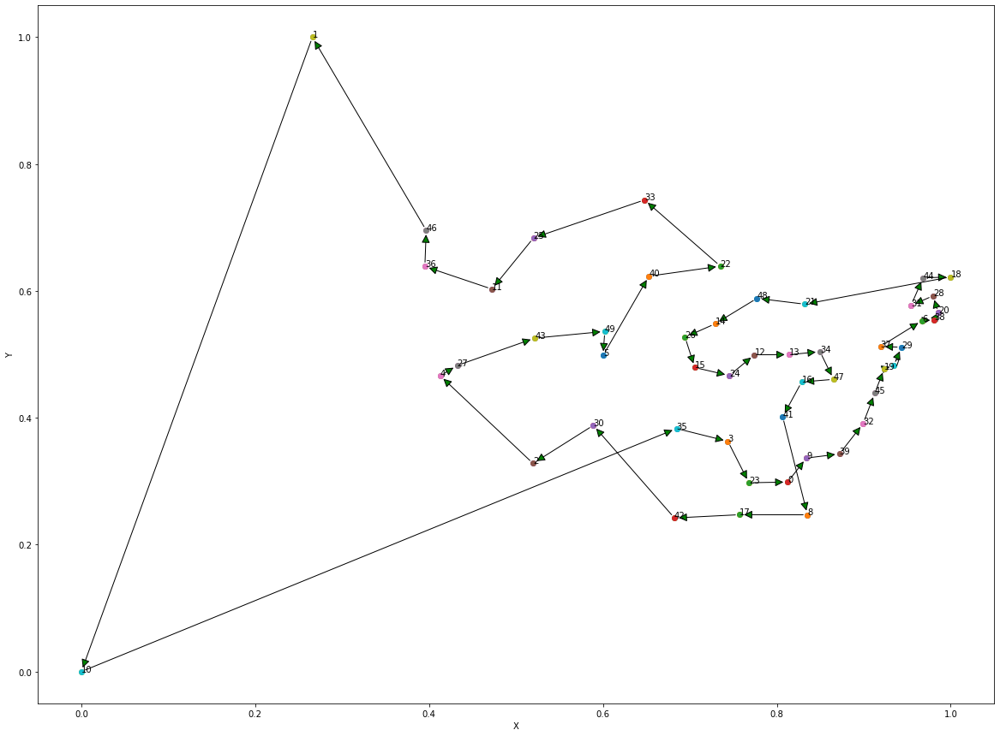

In [18]:
from matplotlib.patches import ConnectionPatch
import matplotlib.pyplot as plt
fig, ax1 = plt.subplots(1, 1, figsize=(20, 15))

def plot(best_route, n, dataset):
    """
    n: the position of the sales man
    Draw a simple arrow between two points in axes coordinates within a single axes.
    
    """
    xyA = dataset[best_route[n]]             
    xyB =  dataset[best_route[n+1]]                                
    coordsA = "data"
    coordsB = "data"
    con = ConnectionPatch(xyA, xyB, coordsA, coordsB,
                          arrowstyle="-|>", shrinkA=5, shrinkB=5,
                          mutation_scale=20, fc="g")
    ax1.plot([xyA[0], xyB[0]], [xyA[1], xyB[1]], "o")
    ax1.add_artist(con)
    ax1.annotate(str(best_route[n]), xy = (dataset[best_route[n]][0], dataset[best_route[n]][1]) )
    ax1.set_xlabel("X")
    ax1.set_ylabel("Y")


for n in range(len(normalized_data)):
    plot(get_best_tsp,n, normalized_data)

print(f"Total distance covered by salesman : {get_best_distance}")
print(f"Salesman route : {get_best_tsp}")

In [19]:
#convert the data to numeric
data_final=data_final.apply(pd.to_numeric)

In [20]:
#use the define function to compute the final distance: This is the optimal from my heuristic
compute_final_distance(data_final, get_best_tsp)

The total distance is : 22761.950710897196


Note : In my implementation , it is ideal for the dataset to be normalized first to speed up computationn time. That is why i normalized the data first , get the best route then finally calculate the total distance based on that.

**Question 2**